# Batch correction method comparison

**Started:** July 28, 2026

**Last updated:** August 18, 2026

**Research questions:** Which batch correction method results in the best "out-of-distribution" alignment of cell populations? Meaning when a population is left out of correction, which batch correction method aligns those populations best? 

**Hypothesis:** I anticipate that scANVI will perform best at batch correction compared to Symphony and a per-gene ratio-scaling baseline because a 2025 Nature Methods study (Zappia et al) found that it generalizes better to unseen populations. 

**Conclusion:** Only scANVI can map to the original reference space (transcript counts). In PCA space, Symphony mixes batches better, while scANVI generates purer populations.

**Potential Next Steps:** Try on additional datasets. Try other batch correction methods as appropriate.


**Note on gene space:** After cell-type labeling, atlas + BCG objects used for batch correction are projected onto **all genes in `ATLAS_HVG_H5AD`** (no extra expression filter: we do not drop lowly expressed genes). Early BCG/atlas clustering for labels still uses the full mouse transcriptome so markers like Flt3/Cd48 remain available.


## Paths

Edit the strings in the next cell to point at different BCG matrices, atlas files, HVG lists, or scANVI output paths. The rest of the notebook reads from these variables.


In [5]:
# --- edit these filepath strings ---

MOUSE_D0_DIR = "/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/tb/data/mouse_bcg/PBS"
MOUSE_D28_DIR = "/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/tb/data/mouse_bcg/BCG"
MOUSE_H5AD = "/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/data/tabula_muris/sampled_mouse_shared.h5ad"
HUMAN_H5AD = "/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/data/tabula_sapiens/sampled_human_shared.h5ad"

# Atlas-full HVG list (same as notebook 16 / CellOT). Keep FLAVOR consistent with the filename.
FLAVOR = "pearson_residuals"  # or "seurat_v3"
ATLAS_HVG_H5AD = "/n/holylabs/mooney_lab/Lab/junyizhou/speciesOT/cellot/cellot_gpu/datasets/speciesot-human-mouse-hvg/hvg_pearson_residuals_a_uncapped_v08.h5ad"
ORTHO_CACHE = "/n/holylabs/mooney_lab/Lab/junyizhou/speciesOT/scripts/.biomart_ortholog_cache.csv"

CONTROL_OUT = "/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/tb/data/mouse_bcg/bcg_control_scanvi_081826.h5ad"
TREATED_OUT = "/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/tb/data/mouse_bcg/bcg_treated_scanvi_081826.h5ad"


In [6]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy import sparse
import matplotlib.pyplot as plt
import sys
import os

sys.path.append(os.path.abspath("."))
from speciesot_helpers import match_cells_by_celltype_tissue, strip_ensembl_gene_id

sc.settings.verbosity = 2
# Smaller figures render more reliably in Cursor's notebook viewer
sc.settings.set_figure_params(dpi=100, dpi_save=150, figsize=(4, 4), frameon=False)
np.random.seed(0)

os.makedirs(os.path.dirname(CONTROL_OUT), exist_ok=True)

print("FLAVOR:", FLAVOR)
for name, path in [
    ("MOUSE_D0_DIR", MOUSE_D0_DIR),
    ("MOUSE_D28_DIR", MOUSE_D28_DIR),
    ("MOUSE_H5AD", MOUSE_H5AD),
    ("HUMAN_H5AD", HUMAN_H5AD),
    ("ATLAS_HVG_H5AD", ATLAS_HVG_H5AD),
    ("ORTHO_CACHE", ORTHO_CACHE),
    ("CONTROL_OUT (parent)", os.path.dirname(CONTROL_OUT)),
    ("TREATED_OUT (parent)", os.path.dirname(TREATED_OUT)),
]:
    print(f"  {name}: {os.path.exists(path)}  {path}")


FLAVOR: pearson_residuals
  MOUSE_D0_DIR: True  /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/tb/data/mouse_bcg/PBS
  MOUSE_D28_DIR: True  /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/tb/data/mouse_bcg/BCG
  MOUSE_H5AD: True  /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/data/tabula_muris/sampled_mouse_shared.h5ad
  HUMAN_H5AD: True  /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/data/tabula_sapiens/sampled_human_shared.h5ad
  ATLAS_HVG_H5AD: True  /n/holylabs/mooney_lab/Lab/junyizhou/speciesOT/cellot/cellot_gpu/datasets/speciesot-human-mouse-hvg/hvg_pearson_residuals_a_uncapped_v08.h5ad
  ORTHO_CACHE: True  /n/holylabs/mooney_lab/Lab/junyizhou/speciesOT/scripts/.biomart_ortholog_cache.csv
  CONTROL_OUT (parent): True  /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/tb/data/mouse_bcg
  TREATED_OUT (parent): True  /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/tb/data/mouse_bcg


### Load and QC BCG/TB mouse day 0 and day 28 data

In [7]:
MT_PCT_MAX = 4.7
MIN_GENES = 500

### Atlas HVG gene space (notebook 16–compatible)

Load **all genes** from `ATLAS_HVG_H5AD` and helpers to project mouse AnnData into that column space via one-to-one BioMart orthologs (ENSMUSG → ENSG), zero-filling missing genes. Do not drop genes for low expression after this subset. Cell-type labeling can still use the full mouse transcriptome; batch-correction inputs are projected before method comparison.


In [8]:
# Fixed atlas HVG gene list + ortholog maps (same contract as notebook 16)
_atlas_hvg_adata = sc.read_h5ad(ATLAS_HVG_H5AD, backed="r")
ATLAS_HVG_GENES = [strip_ensembl_gene_id(x) for x in _atlas_hvg_adata.var_names.astype(str)]
_atlas_hvg_adata.file.close()
print(f"ATLAS_HVG_H5AD n_genes={len(ATLAS_HVG_GENES)}")

ortho_df = pd.read_csv(ORTHO_CACHE)
if "orthology_type" in ortho_df.columns:
    ortho_df = ortho_df[ortho_df["orthology_type"] == "ortholog_one2one"].copy()
ortho_df["human_ensembl_id"] = ortho_df["human_ensembl_id"].astype(str).map(strip_ensembl_gene_id)
ortho_df["mouse_ensembl_id"] = ortho_df["mouse_ensembl_id"].astype(str).map(strip_ensembl_gene_id)

ENSG2MUSG = dict(zip(ortho_df["human_ensembl_id"], ortho_df["mouse_ensembl_id"]))
MUSG2ENSG = dict(zip(ortho_df["mouse_ensembl_id"], ortho_df["human_ensembl_id"]))
_SYM2MUSG = {}
_SYM2ENSG = {}
for _, row in ortho_df.iterrows():
    sym = str(row.get("mouse_gene_name", ""))
    if not sym or sym == "nan":
        continue
    _SYM2MUSG[sym] = row["mouse_ensembl_id"]
    _SYM2MUSG[sym.lower()] = row["mouse_ensembl_id"]
    _SYM2ENSG[sym] = row["human_ensembl_id"]
    _SYM2ENSG[sym.lower()] = row["human_ensembl_id"]

print(f"FLAVOR={FLAVOR}: {len(ATLAS_HVG_GENES)} atlas HVGs from {ATLAS_HVG_H5AD}")
print(f"Ortholog one2one pairs: {len(ENSG2MUSG)}")


def _resolve_ensmusg_per_col(adata):
    """Return list of ENSMUSG ids (or None) aligned to adata.var columns."""
    names = [strip_ensembl_gene_id(x) for x in adata.var_names.astype(str)]
    if sum(n.startswith("ENSMUSG") for n in names[:20]) >= 15:
        return [n if n.startswith("ENSMUSG") else None for n in names]

    if "gene_ids" in adata.var.columns:
        out = []
        for x in adata.var["gene_ids"].astype(str):
            x = strip_ensembl_gene_id(x)
            out.append(x if x.startswith("ENSMUSG") else None)
        return out

    out = []
    for n in adata.var_names.astype(str):
        out.append(_SYM2MUSG.get(n) or _SYM2MUSG.get(n.lower()))
    return out


def project_to_atlas_hvg(adata, *, label=""):
    """Project mouse AnnData onto atlas ENSG HVG columns (zero-fill missing).

    Uses ENSMUSG from var_names or var['gene_ids'], then BioMart one2one → ENSG.
    Preserves layers['counts'] when present. Matches notebook 16 column space.
    """
    musg_per_col = _resolve_ensmusg_per_col(adata)
    musg2col = {}
    for j, musg in enumerate(musg_per_col):
        if musg and musg not in musg2col:
            musg2col[musg] = j

    X_src = adata.X.toarray() if sparse.issparse(adata.X) else np.asarray(adata.X)
    X_src = np.asarray(X_src, dtype=np.float32)

    counts_src = None
    if "counts" in adata.layers:
        C = adata.layers["counts"]
        counts_src = C.toarray() if sparse.issparse(C) else np.asarray(C)
        counts_src = np.asarray(counts_src, dtype=np.float32)

    n_genes = len(ATLAS_HVG_GENES)
    X_new = np.zeros((adata.n_obs, n_genes), dtype=np.float32)
    C_new = np.zeros((adata.n_obs, n_genes), dtype=np.float32) if counts_src is not None else None
    present = 0
    for j, ensg in enumerate(ATLAS_HVG_GENES):
        musg = ENSG2MUSG.get(ensg)
        if musg is None:
            continue
        ci = musg2col.get(musg)
        if ci is None:
            continue
        present += 1
        X_new[:, j] = X_src[:, ci]
        if C_new is not None:
            C_new[:, j] = counts_src[:, ci]

    var = pd.DataFrame(index=pd.Index(ATLAS_HVG_GENES, name="ensg"))
    var["highly_variable"] = True
    out = ad.AnnData(X=X_new, obs=adata.obs.copy(), var=var)
    if C_new is not None:
        out.layers["counts"] = C_new
    out.uns["atlas_hvg"] = {
        "flavor": FLAVOR,
        "source": ATLAS_HVG_H5AD,
        "n_present": int(present),
        "n_target": int(n_genes),
        "label": label,
    }
    cov = 100.0 * present / n_genes
    print(f"  project_to_atlas_hvg({label or 'adata'}): coverage {present}/{n_genes} ({cov:.1f}%)")
    return out


def marker_to_ensg(symbols):
    """Map mouse symbols to atlas ENSG ids present in ATLAS_HVG_GENES when possible."""
    hvg = set(ATLAS_HVG_GENES)
    out = []
    for s in symbols:
        e = _SYM2ENSG.get(s) or _SYM2ENSG.get(s.lower())
        if e is not None and e in hvg:
            out.append(e)
    return out

print("Helpers ready: project_to_atlas_hvg, marker_to_ensg")


ATLAS_HVG_H5AD n_genes=1000
FLAVOR=pearson_residuals: 1000 atlas HVGs from /n/holylabs/mooney_lab/Lab/junyizhou/speciesOT/cellot/cellot_gpu/datasets/speciesot-human-mouse-hvg/hvg_pearson_residuals_a_uncapped_v08.h5ad
Ortholog one2one pairs: 14451
Helpers ready: project_to_atlas_hvg, marker_to_ensg


In [10]:
mouse_d0 = sc.read_10x_mtx(MOUSE_D0_DIR)
mouse_d28 = sc.read_10x_mtx(MOUSE_D28_DIR)

for adata in [mouse_d0, mouse_d28]:
    sc.pp.filter_cells(adata, min_genes=MIN_GENES)
    # Keep all genes (including lowly expressed). Gene subsetting is only onto ATLAS_HVG_H5AD later.

    adata.var["mt"] = adata.var["gene_ids"].str.startswith("mt-")
    adata.var["ribo"] = adata.var["gene_ids"].str.startswith(("Rps", "Rpl"))
    adata.var["hb"] = adata.var["gene_ids"].str.startswith(("Hba", "Hbb", "Hbd", "Hbe", "Hbg"))

    sc.pp.calculate_qc_metrics(
        adata,
        qc_vars=["mt", "ribo", "hb"],
        percent_top=None,
        log1p=False,
        inplace=True,
    )

mouse_d0 = mouse_d0[mouse_d0.obs["pct_counts_mt"] <= MT_PCT_MAX].copy()
mouse_d28 = mouse_d28[mouse_d28.obs["pct_counts_mt"] <= MT_PCT_MAX].copy()

mouse_d0, mouse_d28


filtered out 730512 cells that have less than 500 genes expressed
filtered out 735032 cells that have less than 500 genes expressed


(AnnData object with n_obs × n_vars = 6768 × 27998
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
     var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts',
 AnnData object with n_obs × n_vars = 2248 × 27998
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
     var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts')

### Cluster BCG data and isolate LT-HSCs
Day 0 and day 28 are clustered **separately** (not concatenated). LT-HSCs are identified by Leiden clusters enriched for LT-HSC markers (`Slamf1`, `Hlf`, `Mecom`, `Procr`, `Fgd5`, `Mllt3`). PCA uses the atlas HVG gene list from `ATLAS_HVG_H5AD` (mapped to mouse orthologs). Cluster IDs are dataset-specific and should be re-checked against the marker UMAPs below (they will not match the old joint clustering).


=== Day 0 ===
normalizing counts per cell
    finished (0:00:00)
Atlas HVGs used for BCG d0: 996 / 1000 (present in this object via one2one orthologs)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:02)
computing UMAP
    finished (0:00:16)
running Leiden clustering
    finished (0:00:00)

BCG d0: 6768 cells, 9 Leiden clusters


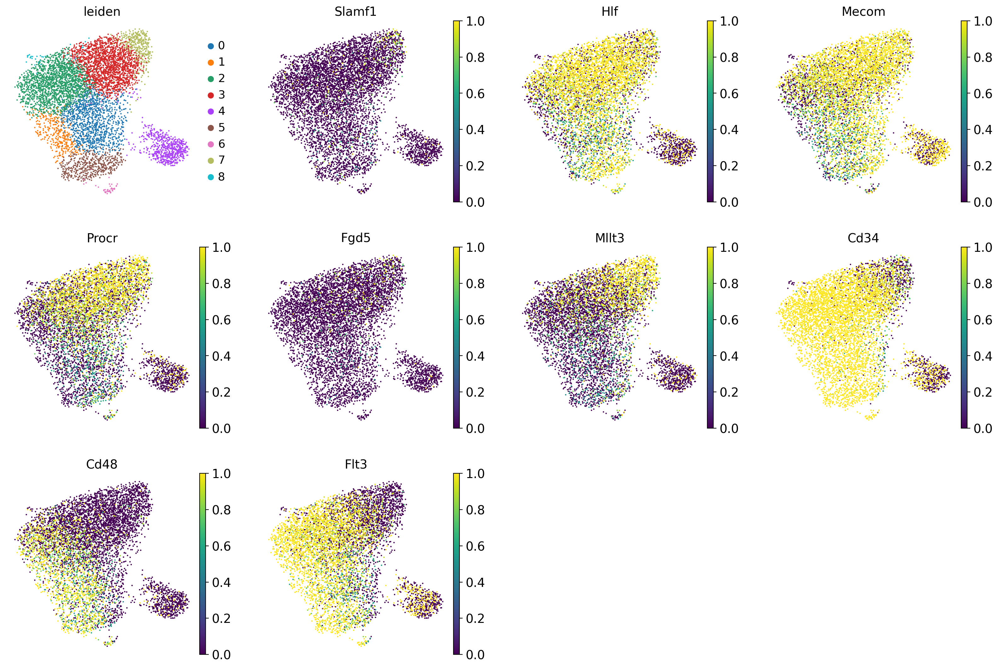

=== Day 28 ===
normalizing counts per cell
    finished (0:00:00)
Atlas HVGs used for BCG d28: 996 / 1000 (present in this object via one2one orthologs)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing UMAP
    finished (0:00:05)
running Leiden clustering
    finished (0:00:00)

BCG d28: 2248 cells, 8 Leiden clusters


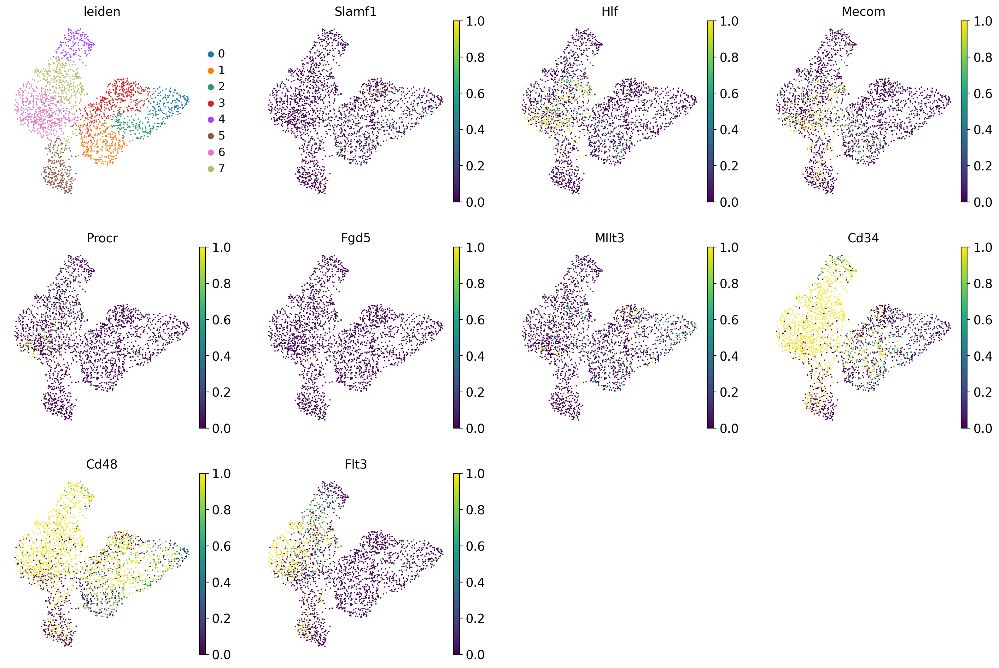

In [11]:
def _mark_atlas_hvgs(adata, label=""):
    """Flag atlas HVG orthologs as highly_variable for PCA (does not subset genes)."""
    atlas_musg = {ENSG2MUSG[e] for e in ATLAS_HVG_GENES if ENSG2MUSG.get(e)}
    musg_per_col = _resolve_ensmusg_per_col(adata)
    adata.var["highly_variable"] = [
        (m is not None and m in atlas_musg) for m in musg_per_col
    ]
    n_atlas_hvg = int(adata.var["highly_variable"].sum())
    print(
        f"Atlas HVGs used for {label or 'PCA'}: {n_atlas_hvg} / {len(ATLAS_HVG_GENES)} "
        f"(present in this object via one2one orthologs)"
    )
    if n_atlas_hvg < 50:
        raise ValueError(f"Too few atlas HVGs mapped into {label or 'adata'} for PCA.")
    return adata


RANDOM_SEED = 0


def preprocess_and_cluster_bcg(adata, *, day, label, random_seed=RANDOM_SEED):
    import random

    np.random.seed(random_seed)
    random.seed(random_seed)
    a = adata.copy()
    a.obs["day"] = day
    a.layers["counts"] = a.X.copy()
    sc.pp.normalize_total(a, target_sum=1e4)
    sc.pp.log1p(a)
    _mark_atlas_hvgs(a, label=label)
    sc.tl.pca(a, random_state=random_seed)
    sc.pp.neighbors(a, random_state=random_seed)
    sc.tl.umap(a, random_state=random_seed)
    sc.tl.leiden(a, flavor="igraph", n_iterations=2, random_state=random_seed)
    print(f"\n{label}: {a.n_obs} cells, {a.obs['leiden'].nunique()} Leiden clusters")
    sc.pl.umap(
        a,
        color=["leiden", "Slamf1", "Hlf", "Mecom", "Procr", "Fgd5", "Mllt3", "Cd34", "Cd48", "Flt3"],
        size=10,
        vmax=1.0,
    )
    return a


print("=== Day 0 ===")
mouse_d0 = preprocess_and_cluster_bcg(mouse_d0, day=0, label="BCG d0")
print("=== Day 28 ===")
mouse_d28 = preprocess_and_cluster_bcg(mouse_d28, day=28, label="BCG d28")


In [12]:
mouse_d0, mouse_d28


(AnnData object with n_obs × n_vars = 6768 × 27998
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'day', 'leiden'
     var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
     uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
     obsm: 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'counts'
     obsp: 'distances', 'connectivities',
 AnnData object with n_obs × n_vars = 2248 × 27998
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'day', 'leiden'
     var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
     uns: 'log1p', 'pca', 'neighbor

In [13]:
# Cluster assignments are per-dataset after splitting d0 / d28.
# Re-check against the marker UMAPs above if clustering changes.
D0_LTHSC_CLUSTERS = ["7"]
D28_LTHSC_CLUSTERS = ["5"]

d0_lthsc = mouse_d0[mouse_d0.obs["leiden"].isin(D0_LTHSC_CLUSTERS)].copy()
d28_lthsc = mouse_d28[mouse_d28.obs["leiden"].isin(D28_LTHSC_CLUSTERS)].copy()

d0_lthsc.obs["cell_type"] = "LT-HSC"
d0_lthsc.obs["shared_cell_type"] = "LT-HSC"
d28_lthsc.obs["cell_type"] = "LT-HSC"
d28_lthsc.obs["shared_cell_type"] = "LT-HSC"

print(f"Day 0 LT-HSC: {d0_lthsc.n_obs}")
print(f"Day 28 LT-HSC: {d28_lthsc.n_obs}")


Day 0 LT-HSC: 387
Day 28 LT-HSC: 251


### Load atlas mouse data and isolate marrow immune / HSC populations

In [14]:
mouse_full = sc.read_h5ad(MOUSE_H5AD)
human_full = sc.read_h5ad(HUMAN_H5AD)

mouse_B = mouse_full.raw.to_adata()
human_B = human_full.raw.to_adata()

mouse_B.obs = mouse_full.obs.copy()
human_B.obs = human_full.obs.copy()

mouse_B = mouse_B[mouse_B.obs["assay"] == "10x 3' v2"]
human_B = human_B[human_B.obs["assay"] == "10x 3' v3"]

mouse_matched_B, human_matched_B = match_cells_by_celltype_tissue(
    mouse_B,
    human_B,
    cell_type_key="cell_type_ontology_term_id",
    tissue_key="tissue_ontology_term_id",
)

for a in [mouse_matched_B, human_matched_B]:
    a.layers["counts"] = a.X.copy()
    a.X = a.X.astype("float32")
    sc.pp.normalize_total(a, target_sum=1e4)
    sc.pp.log1p(a)

shared_immune_cell_types = [
    "T cell",
    "HPSC",
    "macrophage",
    "monocyte",
    "neutrophil",
    "plasma cell",
    "erythrocyte",
    "NK cell",
    "B cell",
    "basophil",
    "dendritic cell",
]

mouse1 = mouse_matched_B[mouse_matched_B.obs["tissue_free_annotation"] == "Marrow"]
mouse1_immune = mouse1[mouse1.obs["shared_cell_type"].isin(shared_immune_cell_types)].copy()

# Keep ENSMUSG for atlas-HVG projection; use symbols as var_names for marker plots / concat
mouse1_immune.var["gene_ids"] = [
    strip_ensembl_gene_id(x) for x in mouse1_immune.var_names.astype(str)
]
if "feature_name" in mouse1_immune.var.columns:
    mouse1_immune.var_names = mouse1_immune.var["feature_name"].astype(str).values
elif "index" in mouse1_immune.var.columns:
    mouse1_immune.var_names = mouse1_immune.var["index"].astype(str).values
mouse1_immune.var_names_make_unique()

mouse1_immune.obs[["assay", "cell_type", "shared_cell_type"]].value_counts()


normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)


assay      cell_type                     shared_cell_type
10x 3' v2  hematopoietic precursor cell  HPSC                613
           natural killer cell           NK cell              42
           monocyte                      monocyte             36
           plasma cell                   plasma cell          17
           basophil                      basophil             13
           macrophage                    macrophage            2
Name: count, dtype: int64

### Combine atlas and BCG LT-HSCs; label atlas LT-HSCs and shared cell types

  project_to_atlas_hvg(atlas_immune): coverage 1000/1000 (100.0%)
  project_to_atlas_hvg(bcg_d0_lthsc): coverage 996/1000 (99.6%)
  project_to_atlas_hvg(bcg_d28_lthsc): coverage 996/1000 (99.6%)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing UMAP
    finished (0:00:03)
running Leiden clustering
    finished (0:00:00)


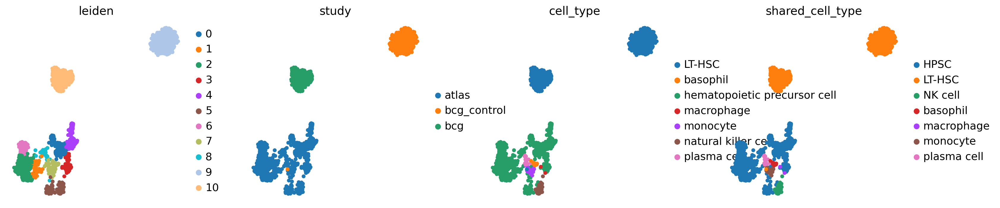

study        cell_type                   
atlas        hematopoietic precursor cell    613
bcg_control  LT-HSC                          387
bcg          LT-HSC                          251
atlas        natural killer cell              42
             monocyte                         36
             plasma cell                      17
             basophil                         13
             macrophage                        2
Name: count, dtype: int64

In [15]:
# Project each cohort into the fixed atlas ENSG HVG space (notebook 16), then combine.
# Do NOT re-select HVGs — use every gene in ATLAS_HVG_H5AD as-is.
mouse1_immune_hvg = project_to_atlas_hvg(mouse1_immune, label="atlas_immune")
d0_lthsc_hvg = project_to_atlas_hvg(d0_lthsc, label="bcg_d0_lthsc")
d28_lthsc_hvg = project_to_atlas_hvg(d28_lthsc, label="bcg_d28_lthsc")

mouse_combined = ad.concat(
    [mouse1_immune_hvg, d0_lthsc_hvg, d28_lthsc_hvg],
    join="inner",
    label="study",
    keys=["atlas", "bcg_control", "bcg"],
)
mouse_combined.var["highly_variable"] = True

sc.tl.pca(mouse_combined)
sc.pp.neighbors(mouse_combined)
sc.tl.umap(mouse_combined)
sc.tl.leiden(mouse_combined, flavor="igraph", n_iterations=2)

sc.pl.umap(mouse_combined, color=["leiden", "study", "cell_type", "shared_cell_type"])
mouse_combined.obs[["study", "cell_type"]].value_counts()


computing PCA
    with n_comps=50


    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
computing UMAP
    finished (0:00:03)


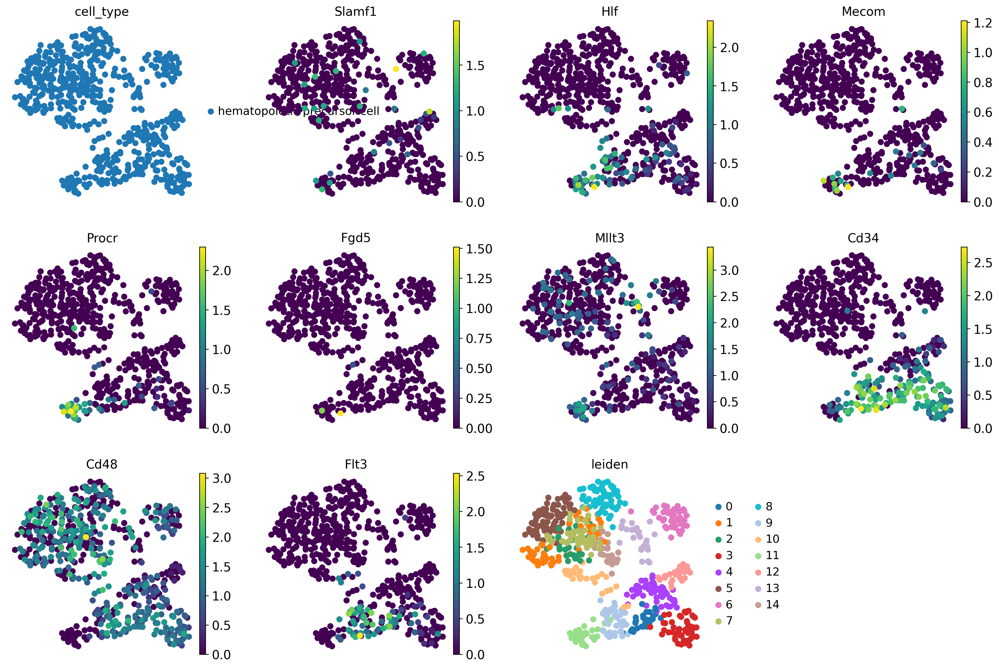

In [16]:
# Identify LT-HSC within atlas hematopoietic precursor cells
atlas_hspc = mouse1_immune[mouse1_immune.obs["cell_type"] == "hematopoietic precursor cell"].copy()

sc.tl.pca(atlas_hspc)
sc.pp.neighbors(atlas_hspc)
sc.tl.leiden(atlas_hspc, flavor="igraph", n_iterations=2, resolution=2)
sc.tl.umap(atlas_hspc)

sc.pl.umap(
    atlas_hspc,
    color=["cell_type", "Slamf1", "Hlf", "Mecom", "Procr", "Fgd5", "Mllt3", "Cd34", "Cd48", "Flt3", "leiden"],
)

In [17]:
# Cluster assignment from tb1_mouse_setup (re-check against marker UMAP above if needed)
ATLAS_LTHSC_CLUSTERS = ["11"]

atlas_lthsc = atlas_hspc[atlas_hspc.obs["leiden"].isin(ATLAS_LTHSC_CLUSTERS)].copy()

# Label atlas LT-HSCs in the combined object
mask = mouse_combined.obs_names.isin(atlas_lthsc.obs_names)
mouse_combined.obs["cell_type"] = mouse_combined.obs["cell_type"].astype(str)
mouse_combined.obs.loc[mask, "cell_type"] = "LT-HSC"

# Day 28 BCG LT-HSCs get a treated label; day 0 remain LT-HSC
mouse_combined.obs.loc[mouse_combined.obs["study"] == "bcg", "cell_type"] = "LT-HSC treated"

# Propagate shared cell type labels: atlas keeps shared_cell_type; BCG LT-HSCs share the LT-HSC label
mouse_combined.obs["shared_cell_type"] = mouse_combined.obs["shared_cell_type"].astype(str)
mouse_combined.obs.loc[mask, "shared_cell_type"] = "LT-HSC"
mouse_combined.obs.loc[
    mouse_combined.obs["study"] == "bcg_control", "shared_cell_type"
] = "LT-HSC"
mouse_combined.obs.loc[
    mouse_combined.obs["study"] == "bcg", "shared_cell_type"
] = "LT-HSC treated"

mouse_combined.obs["cell_type"] = mouse_combined.obs["cell_type"].astype("category")
mouse_combined.obs["shared_cell_type"] = mouse_combined.obs["shared_cell_type"].astype("category")

print(mouse_combined.obs[["study", "cell_type"]].value_counts())
print()
print(mouse_combined.obs[["study", "shared_cell_type"]].value_counts())

atlas = mouse_combined[mouse_combined.obs["study"] == "atlas"].copy()
bcg = mouse_combined[mouse_combined.obs["study"].isin(["bcg_control", "bcg"])].copy()

atlas, bcg

study        cell_type                   
atlas        hematopoietic precursor cell    581
bcg_control  LT-HSC                          387
bcg          LT-HSC treated                  251
atlas        natural killer cell              42
             monocyte                         36
             LT-HSC                           32
             plasma cell                      17
             basophil                         13
             macrophage                        2
Name: count, dtype: int64

study        shared_cell_type
atlas        HPSC                581
bcg_control  LT-HSC              387
bcg          LT-HSC treated      251
atlas        NK cell              42
             monocyte             36
             LT-HSC               32
             plasma cell          17
             basophil             13
             macrophage            2
Name: count, dtype: int64


(AnnData object with n_obs × n_vars = 723 × 1000
     obs: 'n_genes', 'leiden', 'cell_type', 'shared_cell_type', 'study'
     var: 'highly_variable'
     uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'study_colors'
     obsm: 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'counts'
     obsp: 'distances', 'connectivities',
 AnnData object with n_obs × n_vars = 638 × 1000
     obs: 'n_genes', 'leiden', 'cell_type', 'shared_cell_type', 'study'
     var: 'highly_variable'
     uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'study_colors'
     obsm: 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'counts'
     obsp: 'distances', 'connectivities')

### UMAP by shared cell type and study

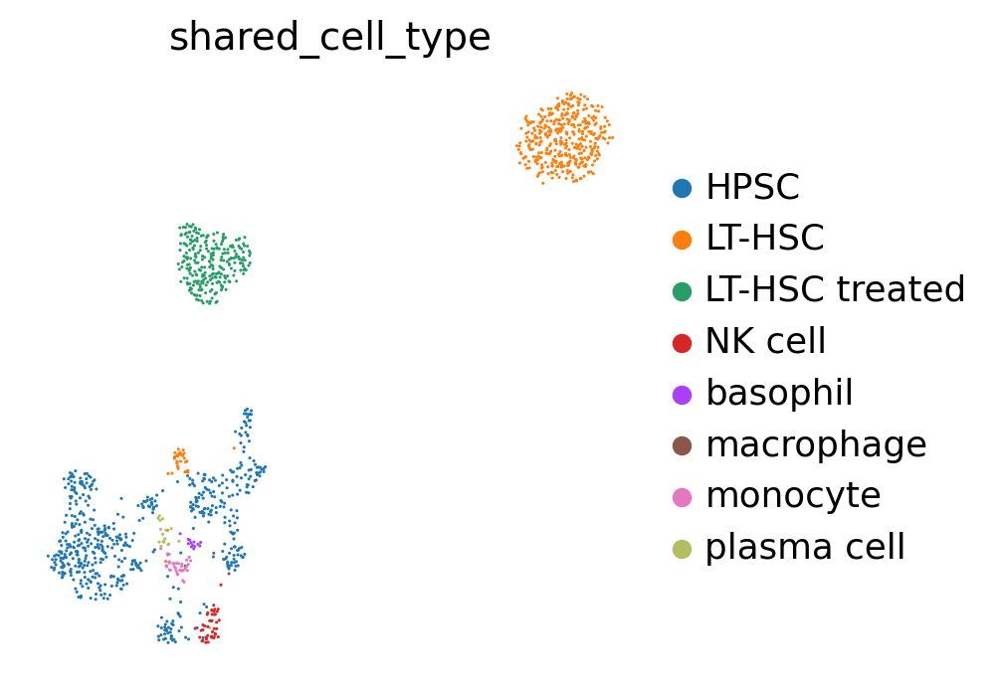

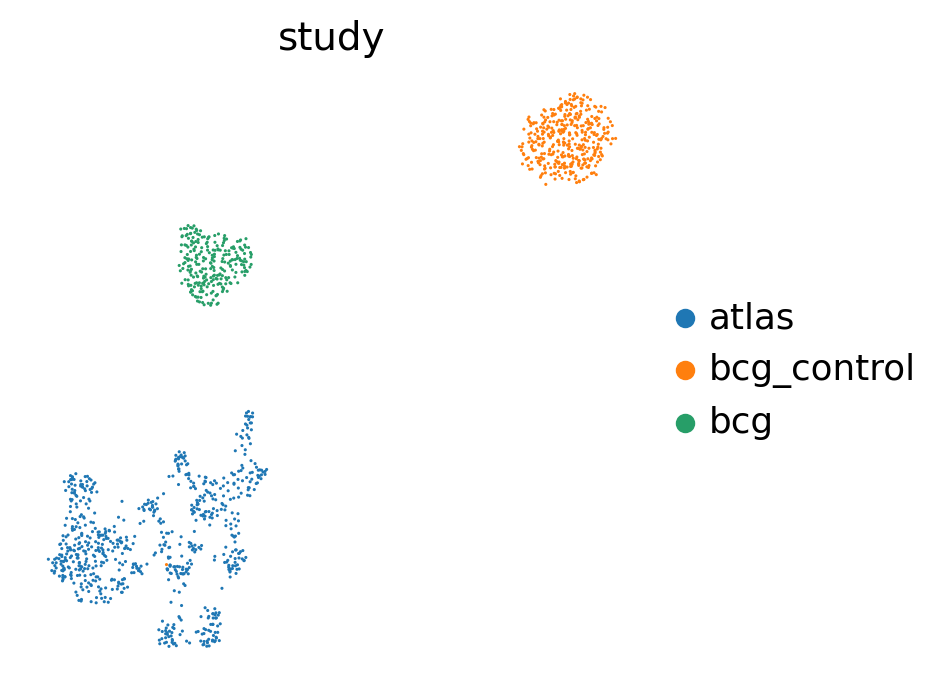

In [18]:
for key in ["shared_cell_type", "study"]:
    sc.pl.umap(mouse_combined, color=key, size=5, show=True)

In [23]:
mouse_combined_lthsc = mouse_combined[(mouse_combined.obs["cell_type"] == "LT-HSC") | (mouse_combined.obs["cell_type"] == "LT-HSC treated")].copy()

### Baseline: LT-HSC mean-ratio reference mapping
Learn per-gene scale factors from LT-HSC means in `atlas` vs `bcg_control`, apply them to all `bcg_control` cells, and return a transform that maps new BCG data into atlas space. Near-zero means are left uncorrected (`ratio=1`); remaining ratios use a pseudocount and are clipped.

In [24]:
def fit_lthsc_ratio_mapping(
    adata,
    *,
    study_key="study",
    cell_type_key="shared_cell_type",
    atlas_study="atlas",
    query_study="bcg_control",
    anchor_cell_type="LT-HSC",
    corrected_study="bcg_control_corrected",
    eps=0.01,
    min_mean=0.01,
    clip_ratio=(0.25, 4.0),
):
    """Per-gene multiplicative mapping from query study into atlas space.

    Ratios are learned so that, for well-expressed genes, the mean LT-HSC
    expression in the corrected query matches the atlas LT-HSC mean:
        ratio_g = (mean_atlas_g + eps) / (mean_query_g + eps)

    Zero / near-zero handling (standard for unstable fold-changes):
      - genes with mean <= min_mean in either anchor population get ratio=1
      - remaining ratios use pseudocount ``eps`` and are clipped to clip_ratio

    Returns
    -------
    corrected : AnnData
        Copy of the query-study cells with X scaled gene-wise and
        ``obs[study_key]`` set to ``corrected_study``.
    transform_to_atlas : callable
        ``transform_to_atlas(new_adata)`` applies the same gene-wise ratios
        to a new AnnData (aligned to the fitted gene set) and returns a copy.
    """
    atlas_anchor = adata[
        (adata.obs[study_key] == atlas_study)
        & (adata.obs[cell_type_key] == anchor_cell_type)
    ]
    query_anchor = adata[
        (adata.obs[study_key] == query_study)
        & (adata.obs[cell_type_key] == anchor_cell_type)
    ]
    query_cells = adata[adata.obs[study_key] == query_study]

    if atlas_anchor.n_obs == 0:
        raise ValueError(f"No {anchor_cell_type} cells found in study={atlas_study!r}")
    if query_anchor.n_obs == 0:
        raise ValueError(f"No {anchor_cell_type} cells found in study={query_study!r}")
    if query_cells.n_obs == 0:
        raise ValueError(f"No cells found in study={query_study!r}")

    def _to_dense(X):
        return X.toarray() if sparse.issparse(X) else np.asarray(X)

    atlas_mean = np.asarray(_to_dense(atlas_anchor.X).mean(axis=0)).ravel()
    query_mean = np.asarray(_to_dense(query_anchor.X).mean(axis=0)).ravel()

    ratio = np.ones(adata.n_vars, dtype=np.float64)
    valid = (atlas_mean > min_mean) & (query_mean > min_mean)
    log_ratio = np.log(atlas_mean[valid] + eps) - np.log(query_mean[valid] + eps)
    if clip_ratio is not None:
        lo, hi = clip_ratio
        log_ratio = np.clip(log_ratio, np.log(lo), np.log(hi))
    ratio[valid] = np.exp(log_ratio)

    gene_names = np.asarray(adata.var_names)

    def _apply_ratios(new_adata, study_label=None):
        missing = [g for g in gene_names if g not in new_adata.var_names]
        if missing:
            raise ValueError(
                f"new_adata is missing {len(missing)} fitted genes "
                f"(e.g. {missing[:5]})"
            )

        out = new_adata[:, gene_names].copy()
        X = _to_dense(out.X).astype(np.float64, copy=False)
        X = X * ratio
        out.X = X
        if study_label is not None:
            out.obs[study_key] = study_label
        out.uns["lthsc_ratio_mapping"] = {
            "gene_names": gene_names,
            "ratio": ratio,
            "eps": eps,
            "min_mean": min_mean,
            "clip_ratio": clip_ratio,
            "n_genes_corrected": int(valid.sum()),
            "atlas_study": atlas_study,
            "query_study": query_study,
            "anchor_cell_type": anchor_cell_type,
        }
        return out

    corrected = _apply_ratios(query_cells, study_label=corrected_study)

    def transform_to_atlas(new_adata, study_label="bcg_corrected"):
        """Map new BCG-study data into atlas space with the fitted ratios."""
        return _apply_ratios(new_adata, study_label=study_label)

    return corrected, transform_to_atlas

In [20]:
bcg_control_corrected, transform_to_atlas = fit_lthsc_ratio_mapping(mouse_combined)

# Sanity check: LT-HSC means should nearly match for corrected genes
atlas_lthsc_mean = np.asarray(
    mouse_combined[
        (mouse_combined.obs["study"] == "atlas")
        & (mouse_combined.obs["shared_cell_type"] == "LT-HSC")
    ].X.mean(axis=0)
).ravel()
corr_lthsc_mean = np.asarray(
    bcg_control_corrected[
        bcg_control_corrected.obs["shared_cell_type"] == "LT-HSC"
    ].X.mean(axis=0)
).ravel()

info = bcg_control_corrected.uns["lthsc_ratio_mapping"]
print(f"Corrected cells: {bcg_control_corrected.n_obs}")
print(f"Genes with applied ratio: {info['n_genes_corrected']} / {bcg_control_corrected.n_vars}")
print(
    "Mean |atlas - corrected| LT-HSC expression "
    f"(corrected genes): {np.mean(np.abs(atlas_lthsc_mean - corr_lthsc_mean)[info['ratio'] != 1]):.4g}"
)

# Example: map day-28 BCG cells with the same transform
bcg_treated = mouse_combined[mouse_combined.obs["study"] == "bcg"].copy()
bcg_treated_corrected = transform_to_atlas(bcg_treated, study_label="bcg_corrected")
bcg_control_corrected, bcg_treated_corrected

Corrected cells: 387
Genes with applied ratio: 383 / 1000
Mean |atlas - corrected| LT-HSC expression (corrected genes): 0.02441


(AnnData object with n_obs × n_vars = 387 × 1000
     obs: 'n_genes', 'leiden', 'cell_type', 'shared_cell_type', 'study'
     var: 'highly_variable'
     uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'study_colors', 'shared_cell_type_colors', 'lthsc_ratio_mapping'
     obsm: 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'counts'
     obsp: 'distances', 'connectivities',
 AnnData object with n_obs × n_vars = 251 × 1000
     obs: 'n_genes', 'leiden', 'cell_type', 'shared_cell_type', 'study'
     var: 'highly_variable'
     uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'study_colors', 'shared_cell_type_colors', 'lthsc_ratio_mapping'
     obsm: 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'counts'
     obsp: 'distances', 'connectivities')

In [21]:
bcg_treated_corrected

AnnData object with n_obs × n_vars = 251 × 1000
    obs: 'n_genes', 'leiden', 'cell_type', 'shared_cell_type', 'study'
    var: 'highly_variable'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'study_colors', 'shared_cell_type_colors', 'lthsc_ratio_mapping'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [22]:
### UMAP of atlas + ratio-corrected BCG (untreated and treated)

computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing UMAP
    finished (0:00:04)


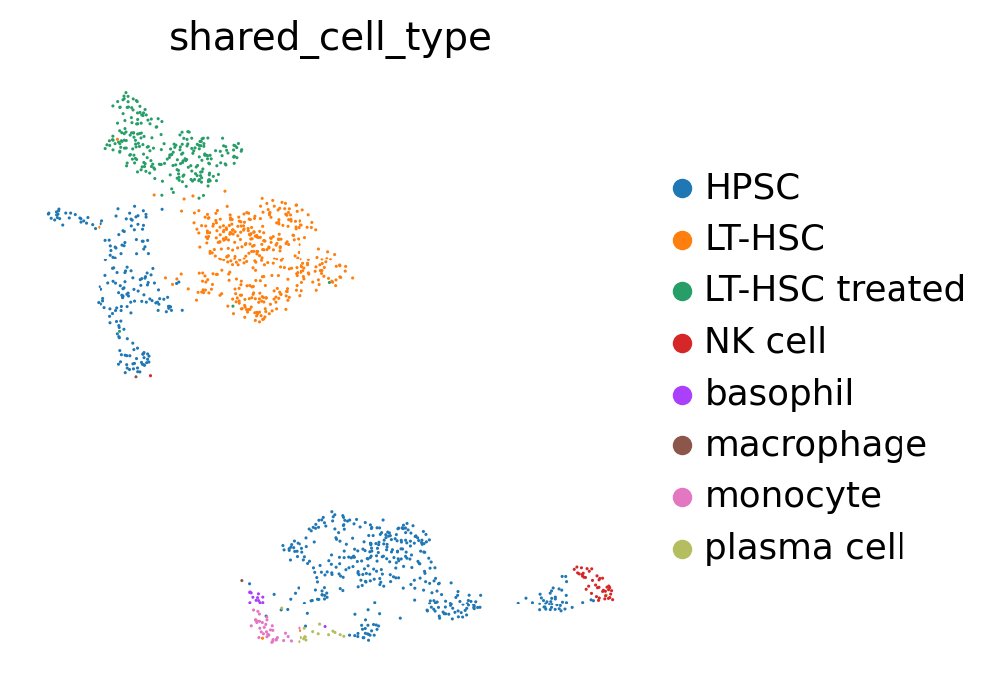

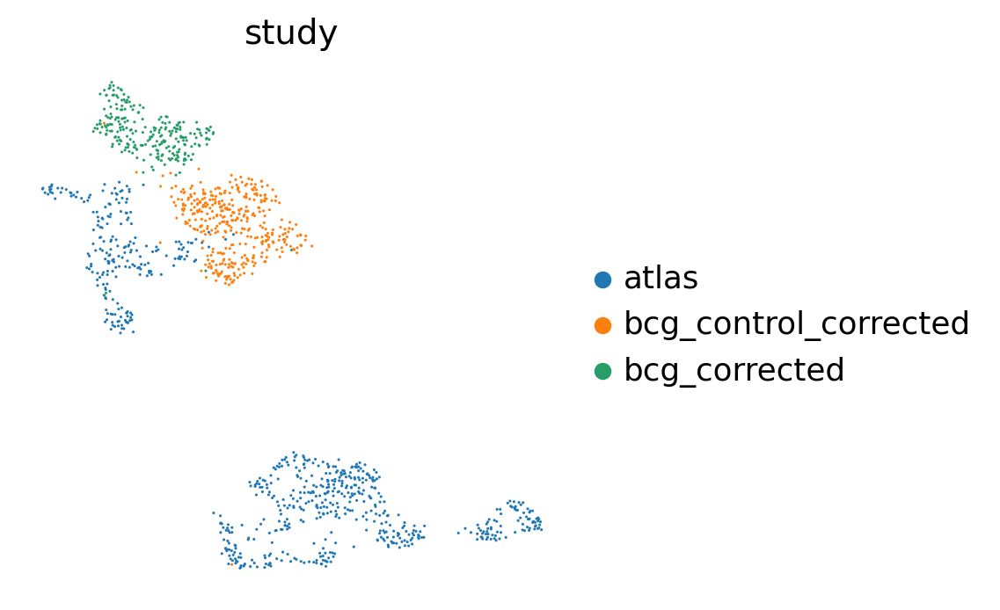

study                  shared_cell_type
atlas                  HPSC                581
bcg_control_corrected  LT-HSC              387
bcg_corrected          LT-HSC treated      251
atlas                  NK cell              42
                       monocyte             36
                       LT-HSC               32
                       plasma cell          17
                       basophil             13
                       macrophage            2
Name: count, dtype: int64

In [25]:
atlas_cells = mouse_combined[mouse_combined.obs["study"] == "atlas"].copy()

ratio_mapped = ad.concat(
    [atlas_cells, bcg_control_corrected, bcg_treated_corrected],
    join="inner",
    index_unique=None,
)

# Already in atlas HVG space from mouse_combined / ratio transform
ratio_mapped.var["highly_variable"] = True
sc.tl.pca(ratio_mapped)
sc.pp.neighbors(ratio_mapped)
sc.tl.umap(ratio_mapped)

# Plot panels separately so each image stays small enough for Cursor to render
for key in ["shared_cell_type", "study"]:
    sc.pl.umap(ratio_mapped, color=key, size=5, show=True)

ratio_mapped.obs[["study", "shared_cell_type"]].value_counts()


### Identify MPP3 (myeloid-biased) and MPP4 (lymphoid-biased) progenitors

Mouse multipotent progenitors are classically resolved with SLAM markers and Flt3/Flk2 within the LSK compartment ([Pietras et al., 2015, *Cell Stem Cell*](https://doi.org/10.1016/j.stem.2015.05.003); [PMC4542150](https://pmc.ncbi.nlm.nih.gov/articles/PMC4542150/)):

| Population | Surface phenotype (LSK) | Bias | scRNA proxies used here |
|---|---|---|---|
| LT-HSC | CD150⁺ CD48⁻ Flt3⁻ | stem | high `Slamf1` / HSC program; low `Cd48` |
| **MPP3** | **CD150⁻ CD48⁺ Flt3⁻** | **myeloid** | **`Cd48` high, `Slamf1` low, `Flt3` low** + myeloid program |
| **MPP4** | **CD150⁻ CD48⁺ Flt3⁺** | **lymphoid (LMPP-like)** | **`Cd48` high, `Slamf1` low, `Flt3` high** + lymphoid program |

Supporting literature:
- [Pietras et al., 2015](https://doi.org/10.1016/j.stem.2015.05.003) — MPP2/MPP3 myeloid-biased vs MPP4 lymphoid-primed; regenerative myeloid amplification
- [Cabezas-Wallscheid et al., 2014](https://doi.org/10.1016/j.stem.2014.07.004) — molecular/functional MPP continuum with the same SLAM/Flt3 scheme
- [Oguro et al., 2013](https://doi.org/10.1016/j.stem.2013.05.014) — SLAM family markers resolve HSC vs MPP subsets
- [Adolfsson et al., 2005](https://doi.org/10.1016/j.cell.2005.02.013) — Flt3⁺ progenitors are lymphoid-primed (LMPP / MPP4-like)

Because these are droplet RNA data (no CITE-seq), we approximate surface phenotypes with expression scores and confirm on UMAP. Cluster IDs below are placeholders to refine after inspecting the marker plots.

In [26]:
# Marker modules (mouse gene symbols). Genes absent from adata are dropped per dataset.
LTHSC_GENES = ["Slamf1", "Hlf", "Mecom", "Procr", "Fgd5", "Mllt3"]
MPP_GATE_GENES = ["Cd48", "Cd34"]  # MPPs: CD48+; CD34 often marks activated progenitors/MPPs
MPP3_GENES = ["Csf1r", "Mpo", "Fcgr3", "Cebpe", "Ms4a3"]  # myeloid priming
MPP4_GENES = ["Flt3", "Il7r", "Dntt", "Rag1", "Notch1"]  # lymphoid priming / Flk2+


def _present(adata, genes):
    return [g for g in genes if g in adata.var_names]


def score_mpp_modules(adata):
    """Add Pietras-style proxy scores for HSC / MPP3 / MPP4 programs."""
    sc.tl.score_genes(adata, _present(adata, LTHSC_GENES), score_name="score_lthsc", use_raw=False)
    sc.tl.score_genes(adata, _present(adata, MPP_GATE_GENES), score_name="score_mpp_gate", use_raw=False)
    sc.tl.score_genes(adata, _present(adata, MPP3_GENES), score_name="score_mpp3", use_raw=False)
    sc.tl.score_genes(adata, _present(adata, MPP4_GENES), score_name="score_mpp4", use_raw=False)
    if "Flt3" in adata.var_names:
        adata.obs["Flt3_expr"] = np.asarray(
            adata[:, "Flt3"].X.toarray() if sparse.issparse(adata[:, "Flt3"].X) else adata[:, "Flt3"].X
        ).ravel()
    else:
        adata.obs["Flt3_expr"] = 0.0
    return adata


def annotate_mpp3_mpp4(
    adata,
    *,
    mpp_gate_quantile=0.55,
    lthsc_quantile=0.70,
    flt3_low_quantile=0.40,
    flt3_high_quantile=0.60,
    program_margin=0.05,
):
    """Label clear LT-HSC / MPP3 / MPP4 cells; leave ambiguous cells as 'other'.

    Gate logic (RNA proxy of Pietras LSK SLAM/Flt3 scheme):
      - LT-HSC: high HSC score AND low MPP-gate score
      - MPP gate: high MPP-gate score AND not LT-HSC-high
      - MPP3: in gate, clearly Flt3-low, and myeloid score >= lymphoid + margin
      - MPP4: in gate, clearly Flt3-high, and lymphoid score >= myeloid + margin
      - other: everything else (including ambiguous MPP-gate cells)
    """
    score_mpp_modules(adata)

    mpp_thr = np.quantile(adata.obs["score_mpp_gate"], mpp_gate_quantile)
    lthsc_thr = np.quantile(adata.obs["score_lthsc"], lthsc_quantile)

    is_lthsc = (adata.obs["score_lthsc"] >= lthsc_thr) & (
        adata.obs["score_mpp_gate"] < mpp_thr
    )
    in_mpp_gate = (adata.obs["score_mpp_gate"] >= mpp_thr) & (
        adata.obs["score_lthsc"] < lthsc_thr
    )

    if in_mpp_gate.any():
        flt3_low_thr = np.quantile(adata.obs.loc[in_mpp_gate, "Flt3_expr"], flt3_low_quantile)
        flt3_high_thr = np.quantile(adata.obs.loc[in_mpp_gate, "Flt3_expr"], flt3_high_quantile)
    else:
        flt3_low_thr = flt3_high_thr = 0.0

    labels = np.array(["other"] * adata.n_obs, dtype=object)
    labels[is_lthsc.to_numpy()] = "LT-HSC"

    idx = np.where(in_mpp_gate.to_numpy())[0]
    for i in idx:
        flt3 = adata.obs["Flt3_expr"].iloc[i]
        m3 = adata.obs["score_mpp3"].iloc[i]
        m4 = adata.obs["score_mpp4"].iloc[i]

        clear_mpp3 = (flt3 <= flt3_low_thr) and (m3 >= m4 + program_margin)
        clear_mpp4 = (flt3 >= flt3_high_thr) and (m4 >= m3 + program_margin)

        if clear_mpp3 and not clear_mpp4:
            labels[i] = "MPP3"
        elif clear_mpp4 and not clear_mpp3:
            labels[i] = "MPP4"
        # else remain 'other' (ambiguous / mixed / intermediate)

    adata.obs["mpp_label"] = pd.Categorical(
        labels, categories=["LT-HSC", "MPP3", "MPP4", "other"]
    )
    adata.uns["mpp_annotation"] = {
        "mpp_gate_threshold": float(mpp_thr),
        "lthsc_threshold": float(lthsc_thr),
        "flt3_low_threshold": float(flt3_low_thr),
        "flt3_high_threshold": float(flt3_high_thr),
        "program_margin": float(program_margin),
        "scheme": "Pietras2015 SLAM/Flt3 RNA proxy (ambiguous -> other)",
    }
    return adata


def plot_mpp_umaps(adata, title_prefix):
    for key in [
        "leiden",
        "score_lthsc",
        "score_mpp_gate",
        "Flt3_expr",
        "score_mpp3",
        "score_mpp4",
        "mpp_label",
        "Slamf1",
        "Cd48",
        "Flt3",
    ]:
        if key in adata.obs.columns or key in adata.var_names:
            sc.pl.umap(adata, color=key, size=12, title=f"{title_prefix}: {key}", show=True)


#### Day 0 BCG: recluster progenitors and annotate MPP3 / MPP4
Uses `mouse_d0` (already QC'd / log-normalized / clustered on its own). Recompute neighbors/UMAP/Leiden at resolution 1.0 for MPP annotation.


extracting highly variable genes
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing UMAP
    finished (0:00:15)
running Leiden clustering
    finished (0:00:00)
computing score 'score_lthsc'
    finished (0:00:00)
computing score 'score_mpp_gate'
    finished (0:00:00)
computing score 'score_mpp3'
    finished (0:00:00)
computing score 'score_mpp4'
    finished (0:00:00)


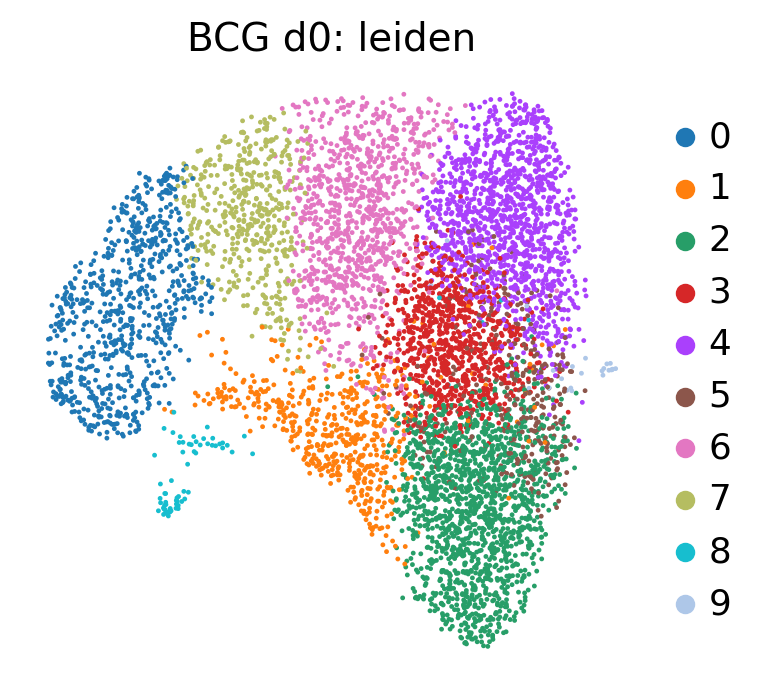

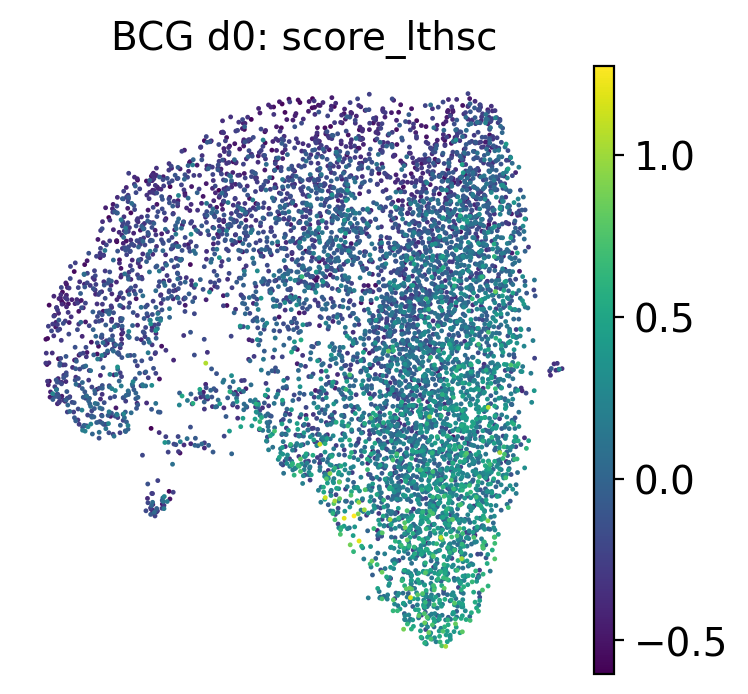

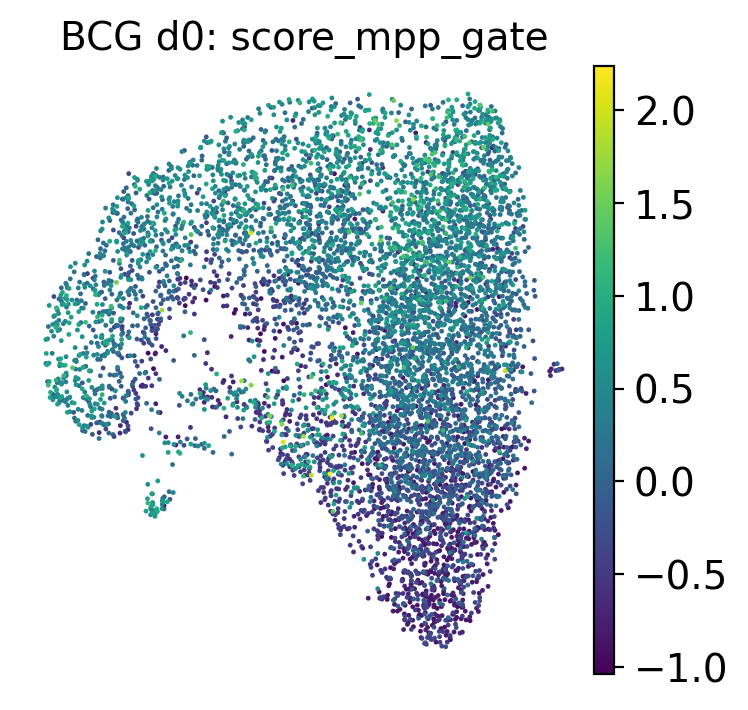

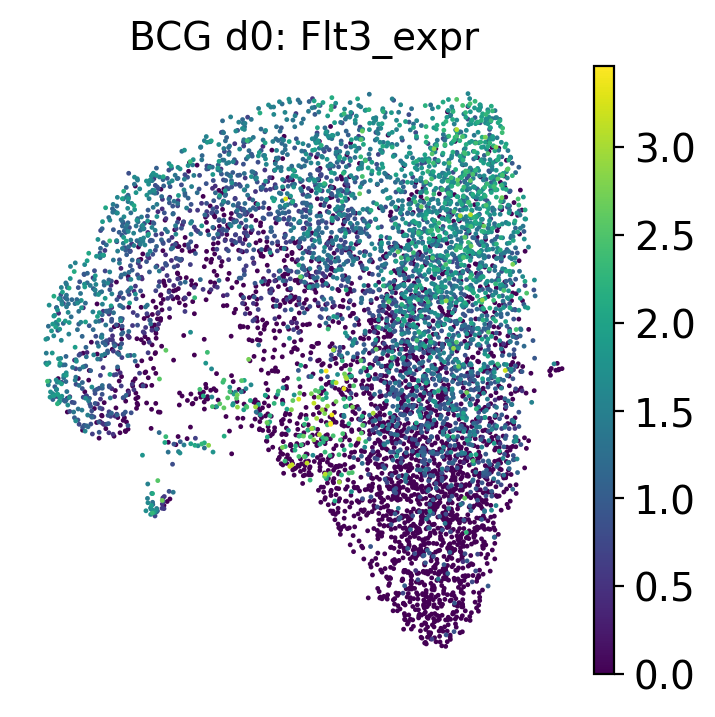

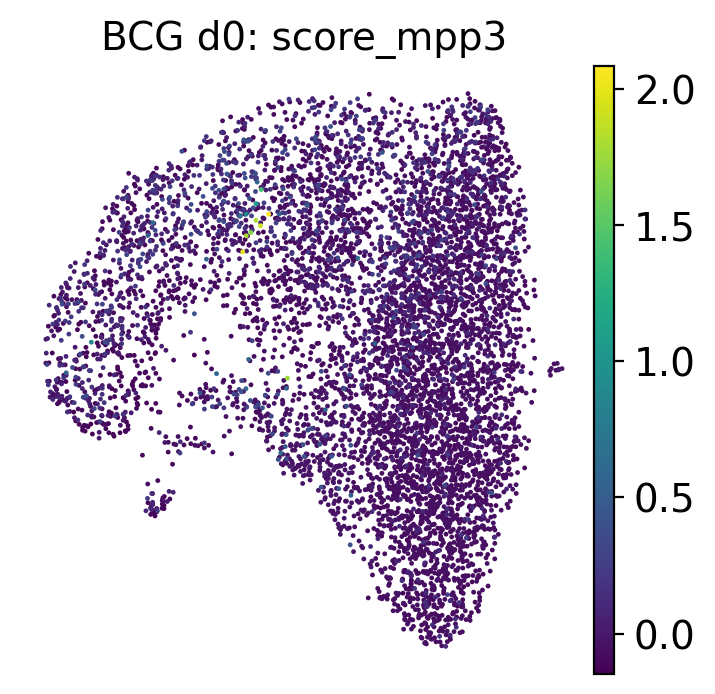

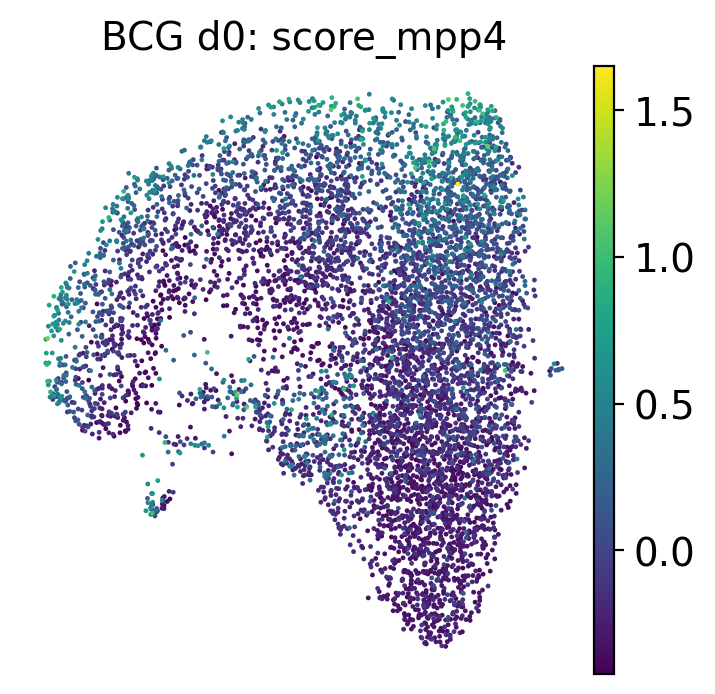

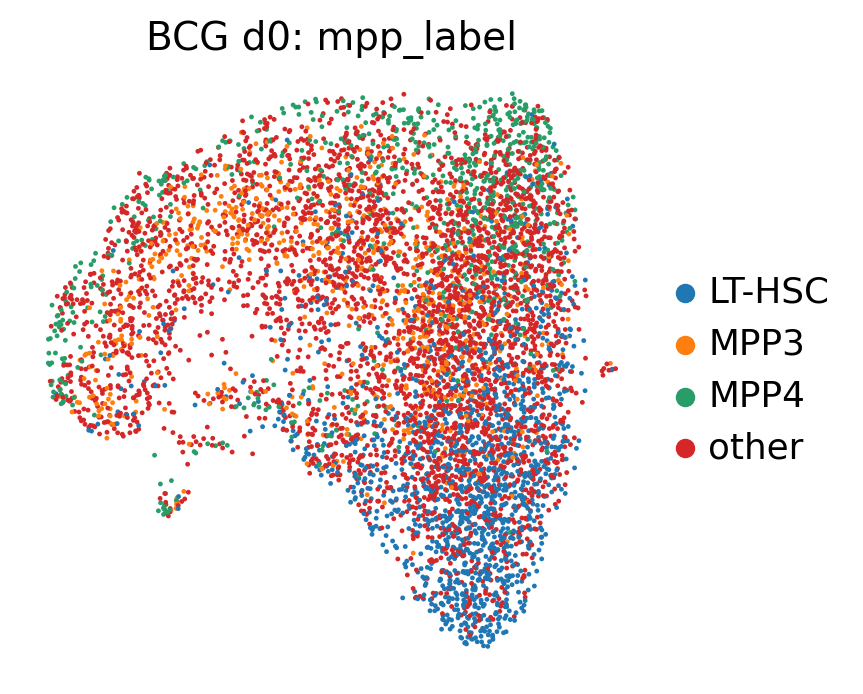

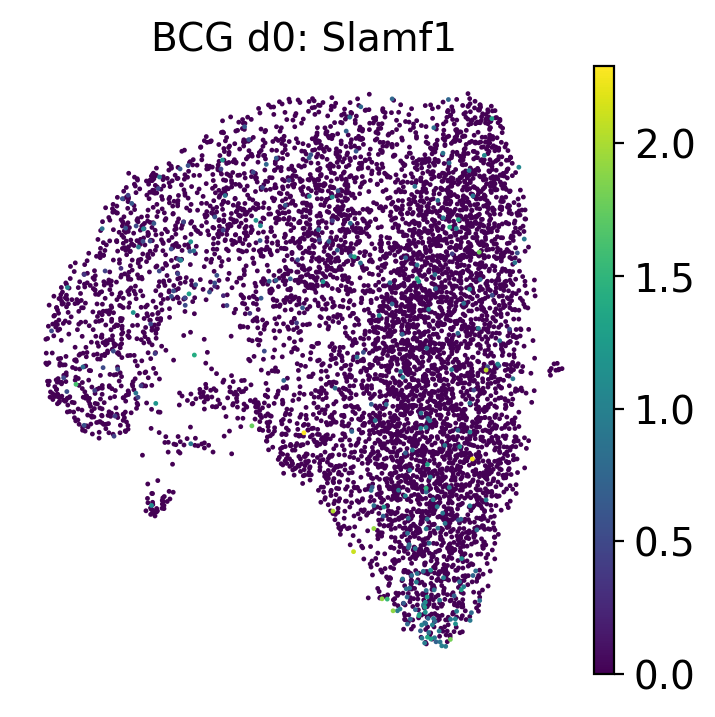

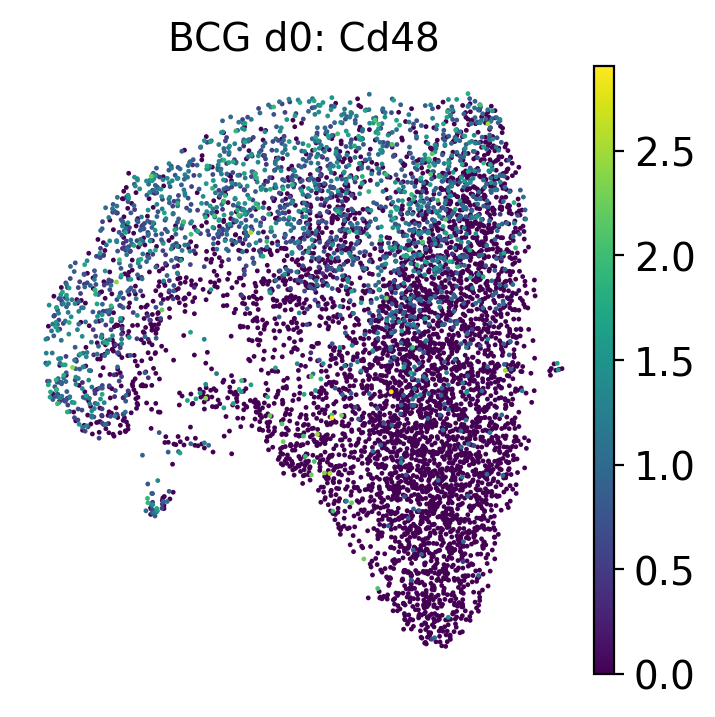

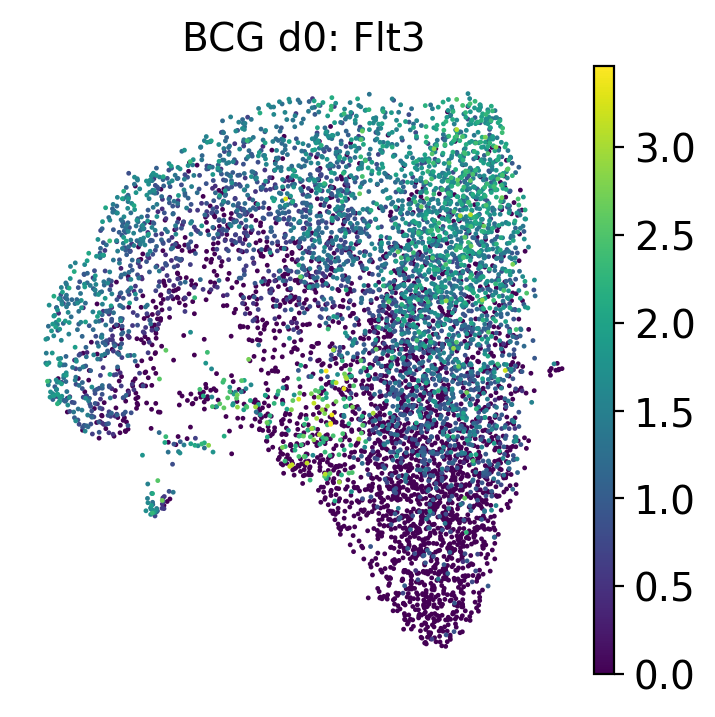

mpp_label
other     3669
LT-HSC    1485
MPP4       831
MPP3       783
Name: count, dtype: int64
Thresholds: {'mpp_gate_threshold': 0.1499759379923345, 'lthsc_threshold': 0.11780874444611698, 'flt3_low_threshold': 0.9634288549423218, 'flt3_high_threshold': 1.3679779767990112, 'program_margin': 0.05, 'scheme': 'Pietras2015 SLAM/Flt3 RNA proxy (ambiguous -> other)'}
Isolated BCG d0 MPP3: 783, MPP4: 831


(AnnData object with n_obs × n_vars = 783 × 27998
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'day', 'leiden', 'score_lthsc', 'score_mpp_gate', 'score_mpp3', 'score_mpp4', 'Flt3_expr', 'mpp_label', 'cell_type', 'shared_cell_type'
     var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'hvg', 'mpp_annotation', 'mpp_label_colors'
     obsm: 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'counts'
     obsp: 'distances', 'connectivities',
 AnnData object with n_obs × n_vars = 831 × 27998
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'

In [27]:
mouse_d0_prog = mouse_d0.copy()

sc.pp.highly_variable_genes(mouse_d0_prog, n_top_genes=2000, flavor="seurat")
sc.tl.pca(mouse_d0_prog)
sc.pp.neighbors(mouse_d0_prog)
sc.tl.umap(mouse_d0_prog)
sc.tl.leiden(mouse_d0_prog, flavor="igraph", n_iterations=2, resolution=1.0)

annotate_mpp3_mpp4(mouse_d0_prog)
plot_mpp_umaps(mouse_d0_prog, "BCG d0")

print(mouse_d0_prog.obs["mpp_label"].value_counts())
print("Thresholds:", mouse_d0_prog.uns["mpp_annotation"])

d0_mpp3 = mouse_d0_prog[mouse_d0_prog.obs["mpp_label"] == "MPP3"].copy()
d0_mpp4 = mouse_d0_prog[mouse_d0_prog.obs["mpp_label"] == "MPP4"].copy()
d0_mpp3.obs["cell_type"] = "MPP3"
d0_mpp3.obs["shared_cell_type"] = "MPP3"
d0_mpp4.obs["cell_type"] = "MPP4"
d0_mpp4.obs["shared_cell_type"] = "MPP4"

print(f"Isolated BCG d0 MPP3: {d0_mpp3.n_obs}, MPP4: {d0_mpp4.n_obs}")
d0_mpp3, d0_mpp4


#### Atlas bone-marrow HSPCs: annotate MPP3 / MPP4
Starts from `atlas_hspc` (Tabula Muris marrow `hematopoietic precursor cell`). Optional Leiden cluster overrides can be filled in after checking the UMAPs if the score gate needs tightening.

computing score 'score_lthsc'
    finished (0:00:00)
computing score 'score_mpp_gate'
    finished (0:00:00)
computing score 'score_mpp3'


    finished (0:00:00)
computing score 'score_mpp4'
    finished (0:00:00)


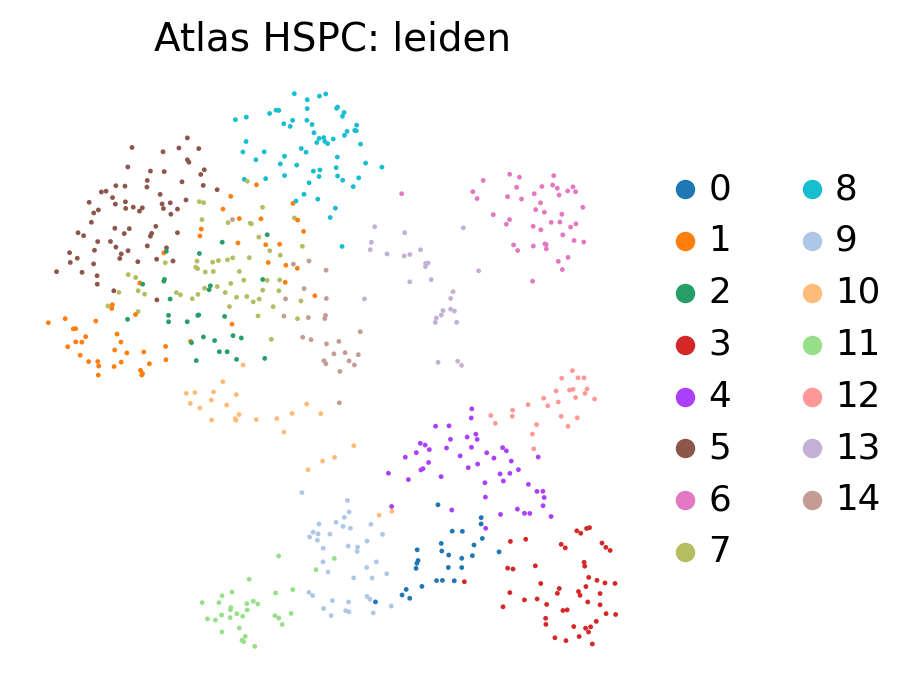

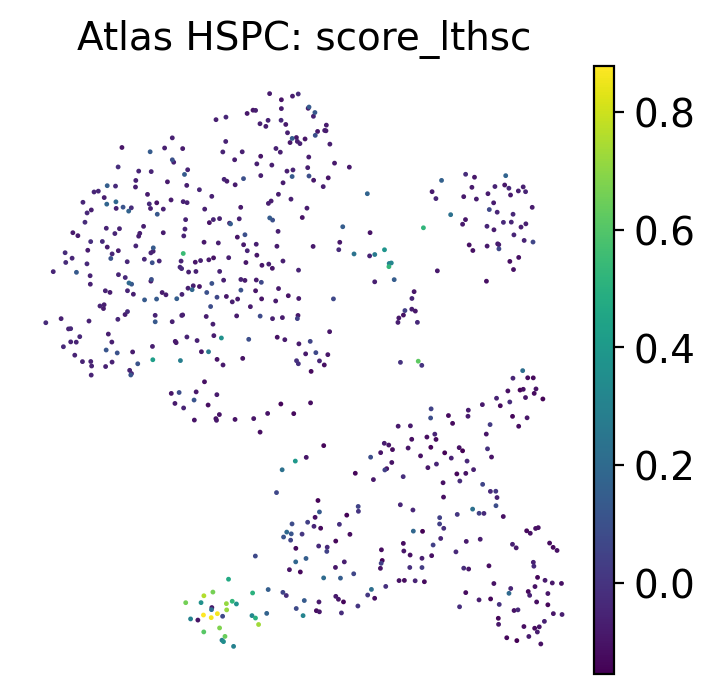

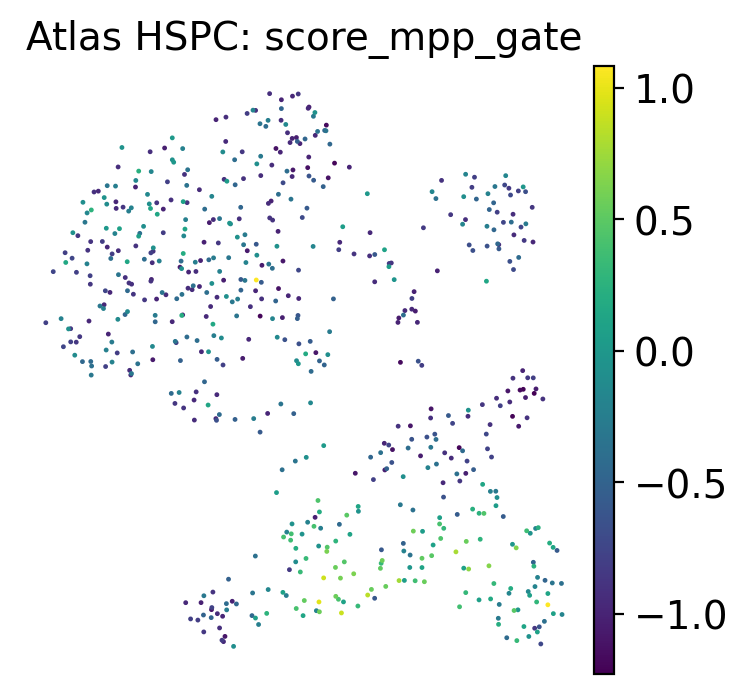

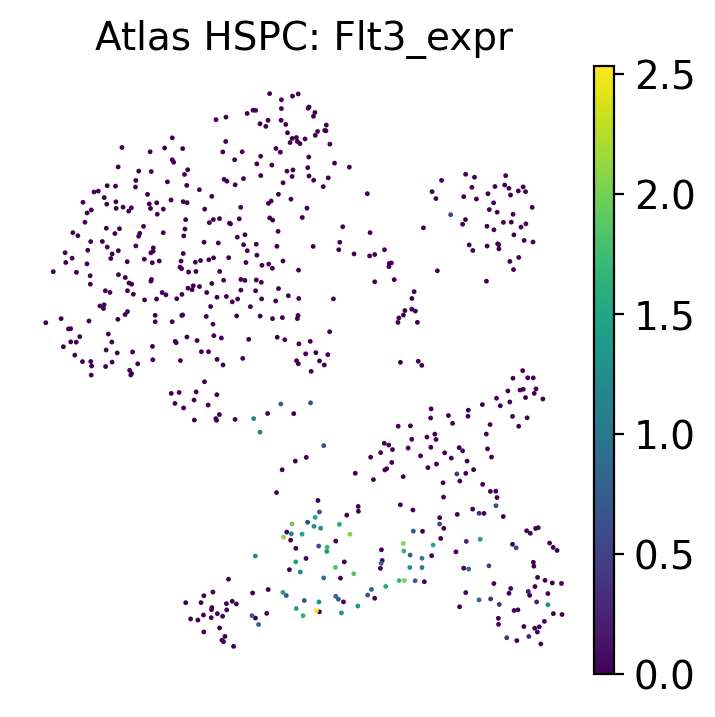

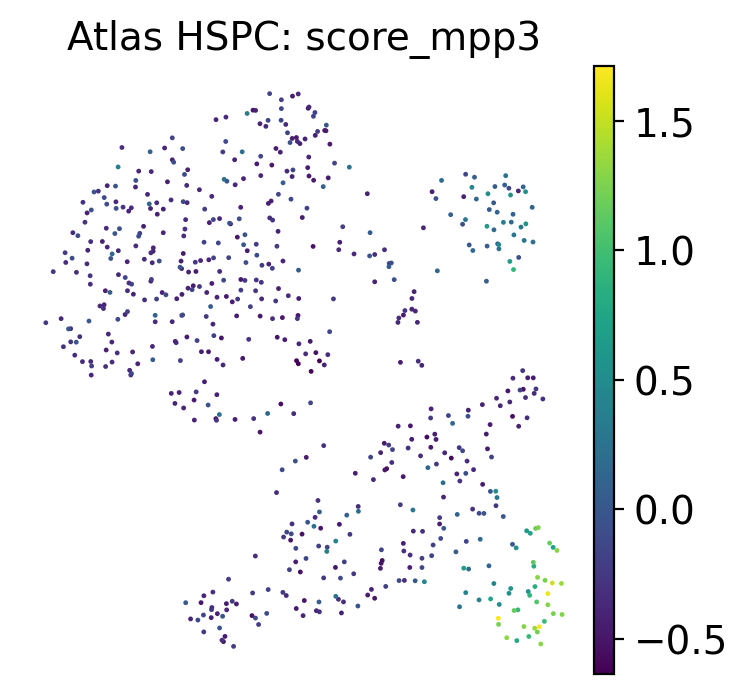

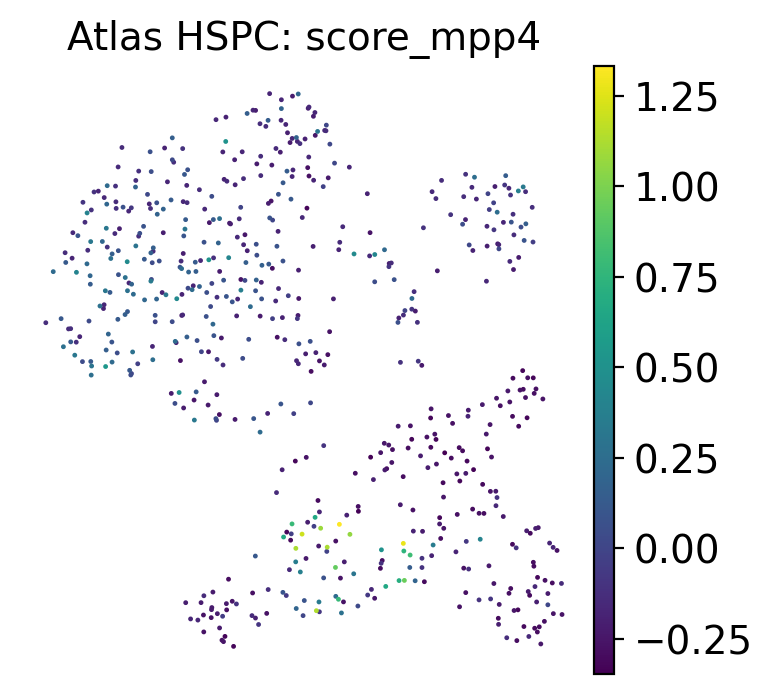

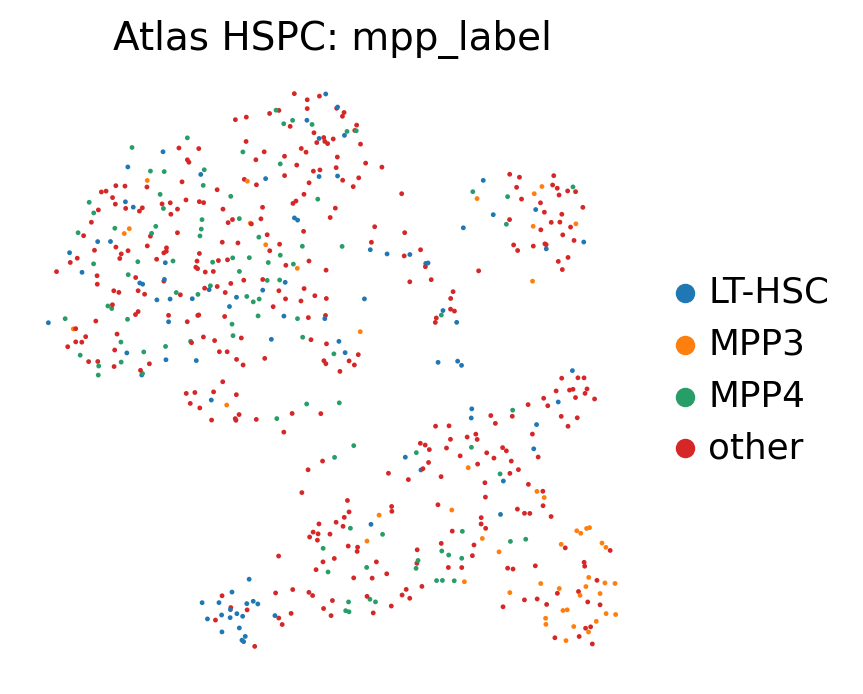

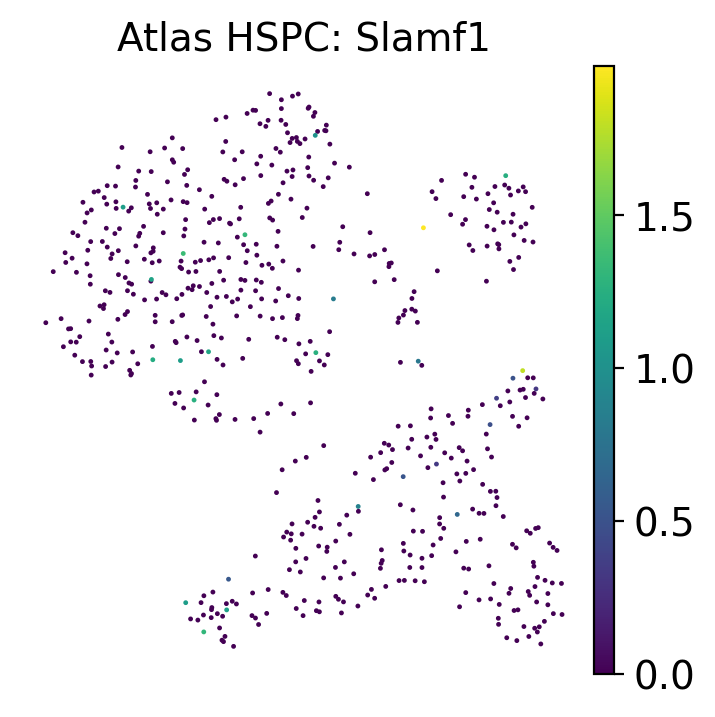

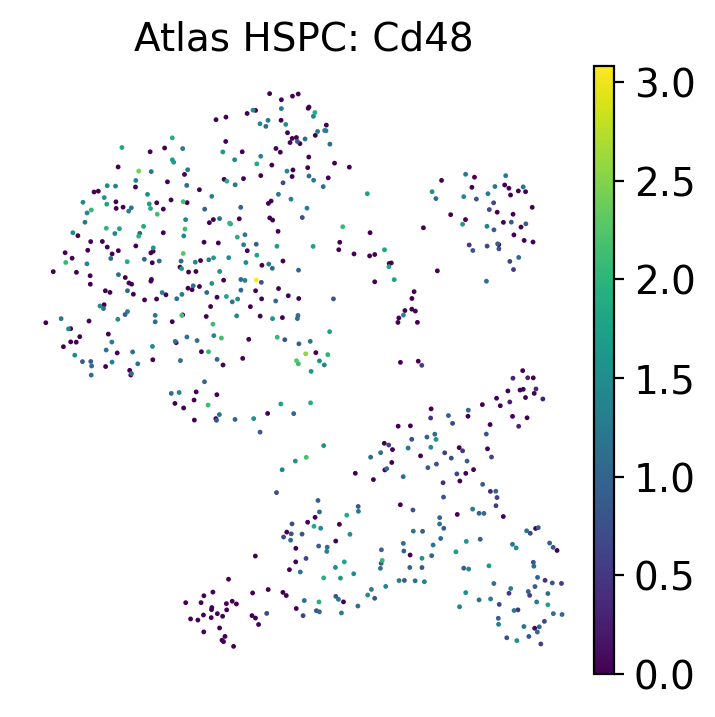

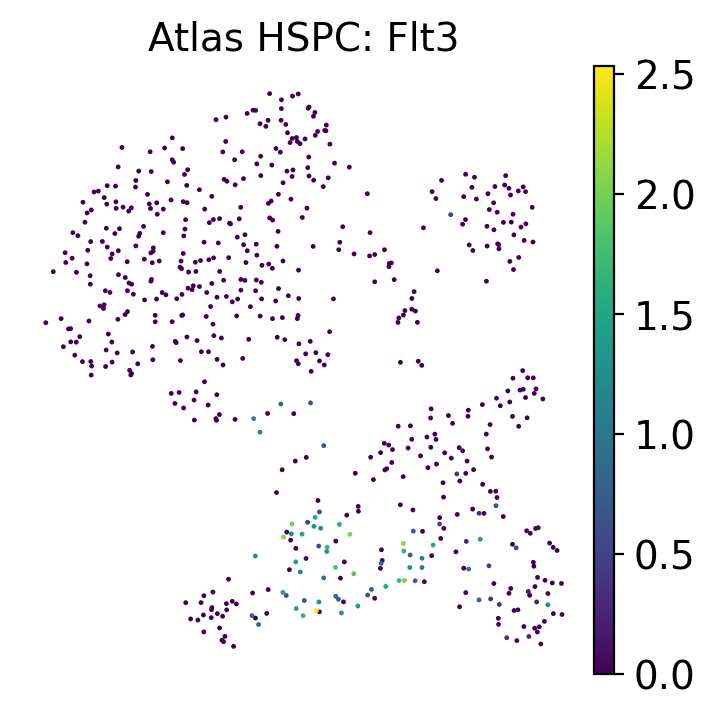

mpp_label
other     368
MPP4      104
LT-HSC     90
MPP3       51
Name: count, dtype: int64
Thresholds: {'mpp_gate_threshold': -0.4011321954727172, 'lthsc_threshold': -0.03488173341751099, 'flt3_low_threshold': 0.0, 'flt3_high_threshold': 0.0, 'program_margin': 0.05, 'scheme': 'Pietras2015 SLAM/Flt3 RNA proxy (ambiguous -> other)'}
Isolated atlas MPP3: 51, MPP4: 104


,n_cells,mean_Flt3,mean_Cd48,mean_Slamf1
atlas_MPP3,51,0.000000,1.110705,0.000000
atlas_MPP4,104,0.231947,1.427772,0.000000
d0_MPP3,783,0.337229,0.698118,0.016879
d0_MPP4,831,1.864403,0.686832,0.021973


In [28]:
# Reuse atlas HSPC object; recompute embedding if missing
atlas_mpp = atlas_hspc.copy()
if "X_umap" not in atlas_mpp.obsm:
    sc.tl.pca(atlas_mpp)
    sc.pp.neighbors(atlas_mpp)
    sc.tl.umap(atlas_mpp)
if "leiden" not in atlas_mpp.obs:
    sc.tl.leiden(atlas_mpp, flavor="igraph", n_iterations=2, resolution=2)

annotate_mpp3_mpp4(atlas_mpp)
plot_mpp_umaps(atlas_mpp, "Atlas HSPC")

print(atlas_mpp.obs["mpp_label"].value_counts())
print("Thresholds:", atlas_mpp.uns["mpp_annotation"])

# Optional: after inspecting UMAPs, override score labels with Leiden clusters, e.g.:
# ATLAS_MPP3_CLUSTERS = ["3", "5"]
# ATLAS_MPP4_CLUSTERS = ["2", "7"]
# atlas_mpp.obs.loc[atlas_mpp.obs["leiden"].isin(ATLAS_MPP3_CLUSTERS), "mpp_label"] = "MPP3"
# atlas_mpp.obs.loc[atlas_mpp.obs["leiden"].isin(ATLAS_MPP4_CLUSTERS), "mpp_label"] = "MPP4"

atlas_mpp3 = atlas_mpp[atlas_mpp.obs["mpp_label"] == "MPP3"].copy()
atlas_mpp4 = atlas_mpp[atlas_mpp.obs["mpp_label"] == "MPP4"].copy()
atlas_mpp3.obs["cell_type"] = "MPP3"
atlas_mpp3.obs["shared_cell_type"] = "MPP3"
atlas_mpp4.obs["cell_type"] = "MPP4"
atlas_mpp4.obs["shared_cell_type"] = "MPP4"

print(f"Isolated atlas MPP3: {atlas_mpp3.n_obs}, MPP4: {atlas_mpp4.n_obs}")

# Marker summary for QC (expect MPP4 > MPP3 for Flt3; MPP3 higher myeloid score)
def _mean_marker(adata, gene):
    if gene not in adata.var_names or adata.n_obs == 0:
        return np.nan
    x = adata[:, gene].X
    x = x.toarray() if sparse.issparse(x) else np.asarray(x)
    return float(np.mean(x))

qc = pd.DataFrame(
    {
        "n_cells": [atlas_mpp3.n_obs, atlas_mpp4.n_obs, d0_mpp3.n_obs, d0_mpp4.n_obs],
        "mean_Flt3": [
            _mean_marker(atlas_mpp3, "Flt3"),
            _mean_marker(atlas_mpp4, "Flt3"),
            _mean_marker(d0_mpp3, "Flt3"),
            _mean_marker(d0_mpp4, "Flt3"),
        ],
        "mean_Cd48": [
            _mean_marker(atlas_mpp3, "Cd48"),
            _mean_marker(atlas_mpp4, "Cd48"),
            _mean_marker(d0_mpp3, "Cd48"),
            _mean_marker(d0_mpp4, "Cd48"),
        ],
        "mean_Slamf1": [
            _mean_marker(atlas_mpp3, "Slamf1"),
            _mean_marker(atlas_mpp4, "Slamf1"),
            _mean_marker(d0_mpp3, "Slamf1"),
            _mean_marker(d0_mpp4, "Slamf1"),
        ],
    },
    index=["atlas_MPP3", "atlas_MPP4", "d0_MPP3", "d0_MPP4"],
)
qc

### Project labeled populations onto atlas ENSG HVGs

Cell-type calls used the full mouse gene space. From here on (ratio metrics, Symphony, scANVI, exports), all populations are in the same gene space as `ATLAS_HVG_H5AD` (all of its genes; no extra expression filter).


In [29]:
# Project labeled progenitor populations into atlas ENSG HVG space for batch-correction methods.
# (Labeling above used the full mouse transcriptome so markers like Flt3/Cd48 were available.)
d0_lthsc = project_to_atlas_hvg(d0_lthsc, label="bcg_d0_lthsc")
d28_lthsc = project_to_atlas_hvg(d28_lthsc, label="bcg_d28_lthsc")
d0_mpp3 = project_to_atlas_hvg(d0_mpp3, label="bcg_d0_mpp3")
d0_mpp4 = project_to_atlas_hvg(d0_mpp4, label="bcg_d0_mpp4")
atlas_lthsc = project_to_atlas_hvg(atlas_lthsc, label="atlas_lthsc")
atlas_mpp3 = project_to_atlas_hvg(atlas_mpp3, label="atlas_mpp3")
atlas_mpp4 = project_to_atlas_hvg(atlas_mpp4, label="atlas_mpp4")

assert list(d0_lthsc.var_names) == ATLAS_HVG_GENES
print("All batch-correction populations now use atlas ENSG HVG columns.")



  project_to_atlas_hvg(bcg_d0_lthsc): coverage 996/1000 (99.6%)
  project_to_atlas_hvg(bcg_d28_lthsc): coverage 996/1000 (99.6%)
  project_to_atlas_hvg(bcg_d0_mpp3): coverage 996/1000 (99.6%)
  project_to_atlas_hvg(bcg_d0_mpp4): coverage 996/1000 (99.6%)
  project_to_atlas_hvg(atlas_lthsc): coverage 1000/1000 (100.0%)
  project_to_atlas_hvg(atlas_mpp3): coverage 1000/1000 (100.0%)
  project_to_atlas_hvg(atlas_mpp4): coverage 1000/1000 (100.0%)
All batch-correction populations now use atlas ENSG HVG columns.


### Before/after ratio transform: UMAPs and scIB mixing metrics
Apply `transform_to_atlas` to BCG day-0 MPP3/MPP4, subsample each study × cell-type population to 30 cells, then compare:
1. Joint UMAP **before** ratio correction
2. Joint UMAP **after** ratio correction
3. **scIB** mixing metrics via [`scib-metrics`](https://github.com/YosefLab/scib-metrics) (Python port of the [scIB](https://scib.readthedocs.io/) benchmark):
   - **kBET** (`kbet_per_label`): batch mixing within cell types (higher = better mixing)
   - **kNN purity**: fraction of neighbors sharing the cell-type label (higher = better type separation)

Note: classic `scib.metrics.kBET` requires R/`rpy2`; here we use the Python-only `scib_metrics` implementation.


scib 1.1.7, scib-metrics 0.6.0
Genes used (atlas HVG pearson_residuals): 1000

=== BEFORE ratio transform ===
Subsampling each population to 30 cells:
  atlas LT-HSC: 32 -> 30
  atlas MPP3: 51 -> 30
  atlas MPP4: 104 -> 30
  bcg_control LT-HSC: 387 -> 30
  bcg_control MPP3: 783 -> 30
  bcg_control MPP4: 831 -> 30
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing UMAP
    finished (0:00:00)


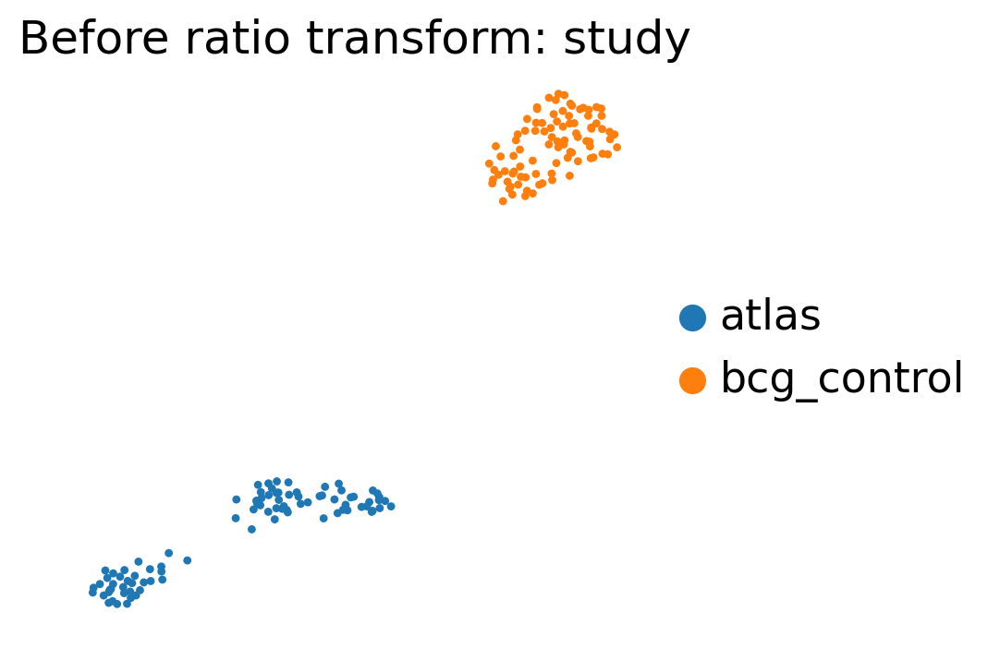

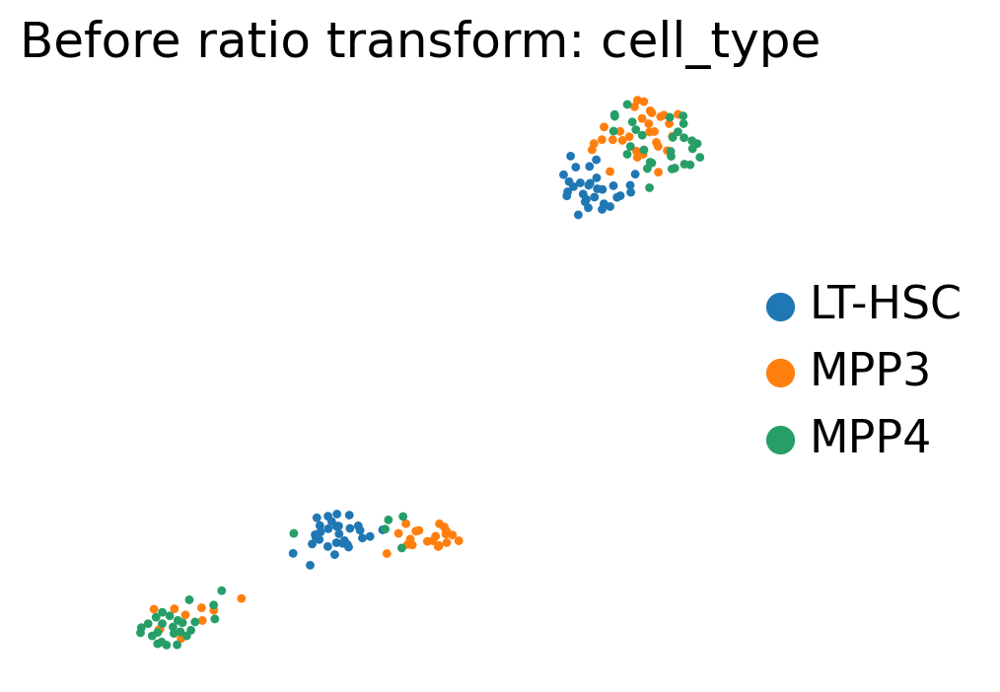


=== AFTER ratio transform ===
Subsampling each population to 30 cells:
  atlas LT-HSC: 32 -> 30
  atlas MPP3: 51 -> 30
  atlas MPP4: 104 -> 30
  bcg_control LT-HSC: 387 -> 30
  bcg_control MPP3: 783 -> 30
  bcg_control MPP4: 831 -> 30
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
computing UMAP
    finished (0:00:00)


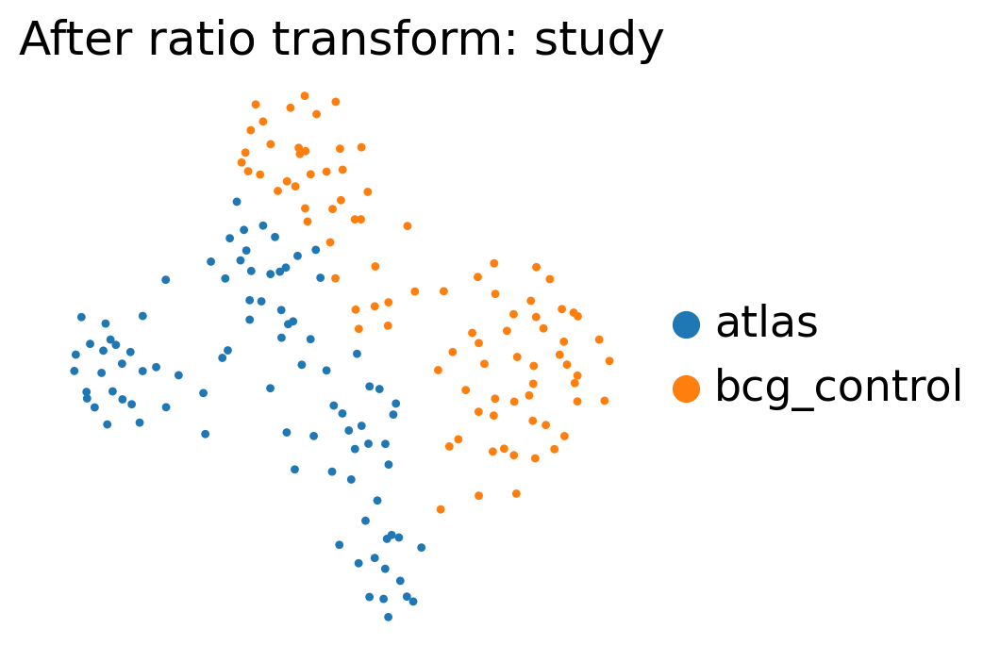

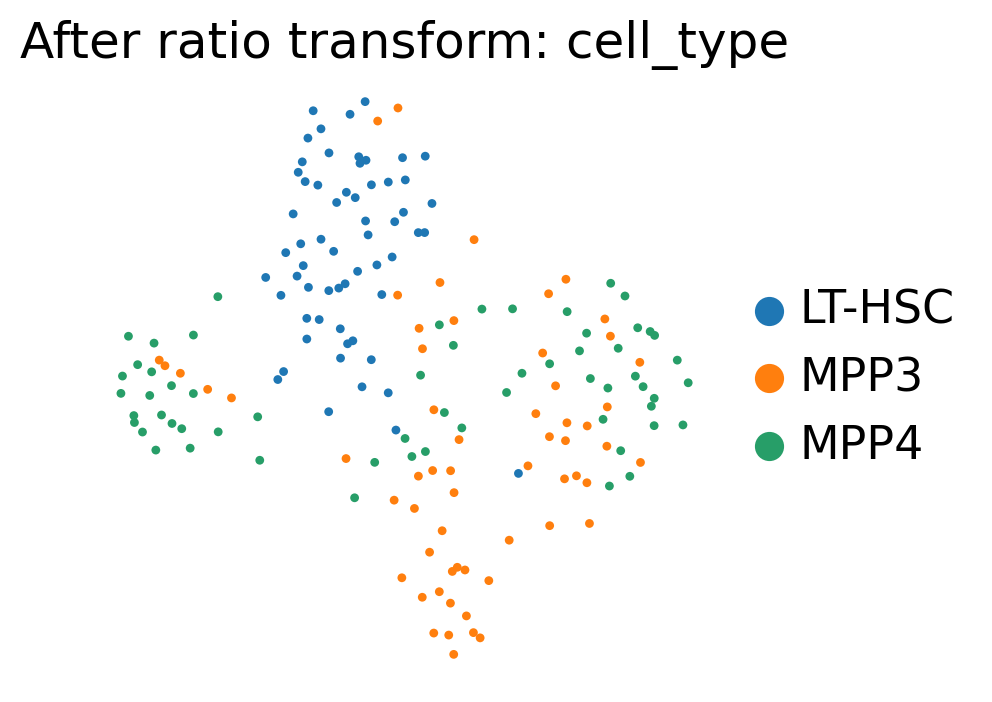

computing PCA
    with n_comps=20
    finished (0:00:00)
computing PCA
    with n_comps=20
    finished (0:00:00)

scIB mixing metrics (kBET + kNN purity):


,after,before,delta_after_minus_before,interpretation
metric,,,,
kBET_per_label,0.344444,0.000000,0.344444,higher = better atlas/bcg mixing within cell t...
kNN_purity_MPP3_MPP4,0.646667,0.644444,0.002222,higher = less MPP3/MPP4 overlap
kNN_purity_all_types,0.690741,0.680741,0.010000,higher = neighbors more often same cell type


In [30]:
import scib
import scib_metrics
from scib_metrics.nearest_neighbors import pynndescent
from scib_metrics.metrics import kbet_per_label
from sklearn.neighbors import NearestNeighbors

print(f"scib {scib.__version__}, scib-metrics {scib_metrics.__version__}")

N_PER_POP = 30
rng = np.random.default_rng(0)
N_PCS = 20
K_NN = 15


def _to_dense(X):
    return X.toarray() if sparse.issparse(X) else np.asarray(X)


def subsample_adata(adata, n=N_PER_POP):
    """Downsample to n cells without replacement (or all cells if fewer than n)."""
    if adata.n_obs == 0:
        raise ValueError("Cannot subsample an empty AnnData")
    n_take = min(n, adata.n_obs)
    idx = rng.choice(adata.n_obs, size=n_take, replace=False)
    if adata.n_obs < n:
        print(f"  warning: only {adata.n_obs} cells available (< {n})")
    return adata[idx].copy()


def prepare_population(adata, study, cell_type, genes):
    out = adata[:, genes].copy()
    out.obs["study"] = study
    out.obs["cell_type"] = cell_type
    return out


def build_balanced(populations, n=N_PER_POP):
    print(f"Subsampling each population to {n} cells:")
    parts = []
    for name, adata in populations:
        print(f"  {name}: {adata.n_obs} -> {min(n, adata.n_obs)}")
        parts.append(subsample_adata(adata, n=n))
    return ad.concat(parts, join="inner", index_unique="-")


def add_pca(adata, n_pcs=N_PCS):
    a = adata.copy()
    # Genes are already the fixed atlas HVG set
    a.var["highly_variable"] = True
    sc.pp.scale(a, max_value=10)
    n_comps = min(n_pcs, a.n_obs - 1, a.n_vars - 1)
    sc.tl.pca(a, n_comps=n_comps, svd_solver="arpack")
    return a


def knn_purity(X, labels, n_neighbors=K_NN):
    """scIB-style kNN purity: mean fraction of neighbors with the same label.

    Higher = better cell-type separation / less MPP3–MPP4 mixing.
    """
    labels = np.asarray(labels)
    n_neighbors = min(n_neighbors, len(labels) - 1)
    nn = NearestNeighbors(n_neighbors=n_neighbors + 1, metric="euclidean").fit(X)
    idx = nn.kneighbors(X, return_distance=False)[:, 1:]  # drop self
    return float(np.mean([np.mean(labels[neigh] == labels[i]) for i, neigh in enumerate(idx)]))


def scib_mixing_metrics(adata, label=""):
    """kBET (scib-metrics) + kNN purity on PCA embedding."""
    a = add_pca(adata)
    X = np.asarray(a.obsm["X_pca"], dtype=np.float64)
    batches = a.obs["study"].astype(str).to_numpy()
    labels = a.obs["cell_type"].astype(str).to_numpy()

    # Neighbors for kBET (exclude self by requesting k+1 if needed; pynndescent returns self as neighbor 0)
    n_neighbors = min(max(K_NN, 10), a.n_obs - 1)
    neigh = pynndescent(X, n_neighbors=n_neighbors, random_state=0)

    kbet_score = float(
        kbet_per_label(
            neigh,
            batches=batches,
            labels=labels,
            alpha=0.05,
            return_df=False,
        )
    )
    purity = knn_purity(X, labels, n_neighbors=K_NN)

    # Also report purity restricted to MPP3/MPP4 only
    mpp_mask = np.isin(labels, ["MPP3", "MPP4"])
    purity_mpp = (
        knn_purity(X[mpp_mask], labels[mpp_mask], n_neighbors=min(K_NN, mpp_mask.sum() - 1))
        if mpp_mask.sum() > K_NN
        else np.nan
    )

    return pd.DataFrame(
        [
            {
                "condition": label,
                "metric": "kBET_per_label",
                "value": kbet_score,
                "interpretation": "higher = better atlas/bcg mixing within cell types",
            },
            {
                "condition": label,
                "metric": "kNN_purity_all_types",
                "value": purity,
                "interpretation": "higher = neighbors more often same cell type",
            },
            {
                "condition": label,
                "metric": "kNN_purity_MPP3_MPP4",
                "value": purity_mpp,
                "interpretation": "higher = less MPP3/MPP4 overlap",
            },
        ]
    )


def run_umap_and_plot(adata, title_prefix):
    a = adata.copy()
    a.var["highly_variable"] = True
    sc.tl.pca(a)
    sc.pp.neighbors(a)
    sc.tl.umap(a)
    for key in ["study", "cell_type"]:
        sc.pl.umap(a, color=key, size=40, title=f"{title_prefix}: {key}", show=True)
    return a


# --- Build corrected BCG objects ---
d0_mpp3_corr = transform_to_atlas(d0_mpp3, study_label="bcg_control")
d0_mpp4_corr = transform_to_atlas(d0_mpp4, study_label="bcg_control")
d0_mpp3_corr.obs["cell_type"] = "MPP3"
d0_mpp4_corr.obs["cell_type"] = "MPP4"

d0_lthsc_corr = bcg_control_corrected.copy()
d0_lthsc_corr.obs["study"] = "bcg_control"
d0_lthsc_corr.obs["cell_type"] = "LT-HSC"

map_genes = list(ATLAS_HVG_GENES)
print(f"Genes used (atlas HVG {FLAVOR}): {len(map_genes)}")

atlas_pops = [
    ("atlas LT-HSC", prepare_population(atlas_lthsc, "atlas", "LT-HSC", map_genes)),
    ("atlas MPP3", prepare_population(atlas_mpp3, "atlas", "MPP3", map_genes)),
    ("atlas MPP4", prepare_population(atlas_mpp4, "atlas", "MPP4", map_genes)),
]
bcg_before_pops = [
    ("bcg_control LT-HSC", prepare_population(d0_lthsc, "bcg_control", "LT-HSC", map_genes)),
    ("bcg_control MPP3", prepare_population(d0_mpp3, "bcg_control", "MPP3", map_genes)),
    ("bcg_control MPP4", prepare_population(d0_mpp4, "bcg_control", "MPP4", map_genes)),
]
bcg_after_pops = [
    ("bcg_control LT-HSC", prepare_population(d0_lthsc_corr, "bcg_control", "LT-HSC", map_genes)),
    ("bcg_control MPP3", prepare_population(d0_mpp3_corr, "bcg_control", "MPP3", map_genes)),
    ("bcg_control MPP4", prepare_population(d0_mpp4_corr, "bcg_control", "MPP4", map_genes)),
]

print("\n=== BEFORE ratio transform ===")
progenitor_before = build_balanced(atlas_pops + bcg_before_pops)
progenitor_before = run_umap_and_plot(progenitor_before, "Before ratio transform")

print("\n=== AFTER ratio transform ===")
progenitor_after = build_balanced(atlas_pops + bcg_after_pops)
progenitor_after = run_umap_and_plot(progenitor_after, "After ratio transform")

metrics = pd.concat(
    [
        scib_mixing_metrics(progenitor_before, label="before"),
        scib_mixing_metrics(progenitor_after, label="after"),
    ],
    ignore_index=True,
)

metrics_wide = metrics.pivot(index="metric", columns="condition", values="value")
metrics_wide["delta_after_minus_before"] = metrics_wide["after"] - metrics_wide["before"]
interp = metrics.drop_duplicates("metric").set_index("metric")[["interpretation"]]
metrics_summary = metrics_wide.join(interp)

print("\nscIB mixing metrics (kBET + kNN purity):")
metrics_summary



### Compare reference mapping methods: ratio, Symphony, and scANVI
Same evaluation populations (atlas + bcg_control × LT-HSC / MPP3 / MPP4, n=30 each):

1. **Ratio** — gene scales fit on LT-HSC means (`transform_to_atlas`), applied to BCG including MPP3/MPP4; metrics on PCA of corrected expression
2. **Symphony** ([symphonypy](https://github.com/potulabe/symphonypy)) — Harmony reference on atlas progenitors, map BCG into `X_pca_harmony`
3. **scANVI** ([scvi-tools](https://docs.scvi-tools.org/)) — train SCVI→SCANVI on atlas with cell-type labels; map BCG query; metrics on `X_scANVI`

Compare **before** (uncorrected) vs the three methods with **kBET_per_label** (↑ better mixing) and **kNN_purity_all_types** (↑ better type separation).


/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightning/fabric/__init__.py:40: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightning/fabric/__init__.py:40: Deprecated call to `pkg_resources.declare_namespace('lightning.fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/pkg_resources/__init__.py:2560: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('lightning')`.
Implementing implicit namespace

scvi-tools 1.5.0.post1
Shared genes (atlas HVG pearson_residuals): 1000

=== Before reference mapping ===
  atlas LT-HSC: 32 -> 30
  atlas MPP3: 51 -> 30
  atlas MPP4: 104 -> 30
  bcg LT-HSC raw: 387 -> 30
  bcg MPP3 raw: 783 -> 30
  bcg MPP4 raw: 831 -> 30
computing PCA
    with n_comps=20
    finished (0:00:00)
computing neighbors
    finished (0:00:00)
computing UMAP
    finished (0:00:00)


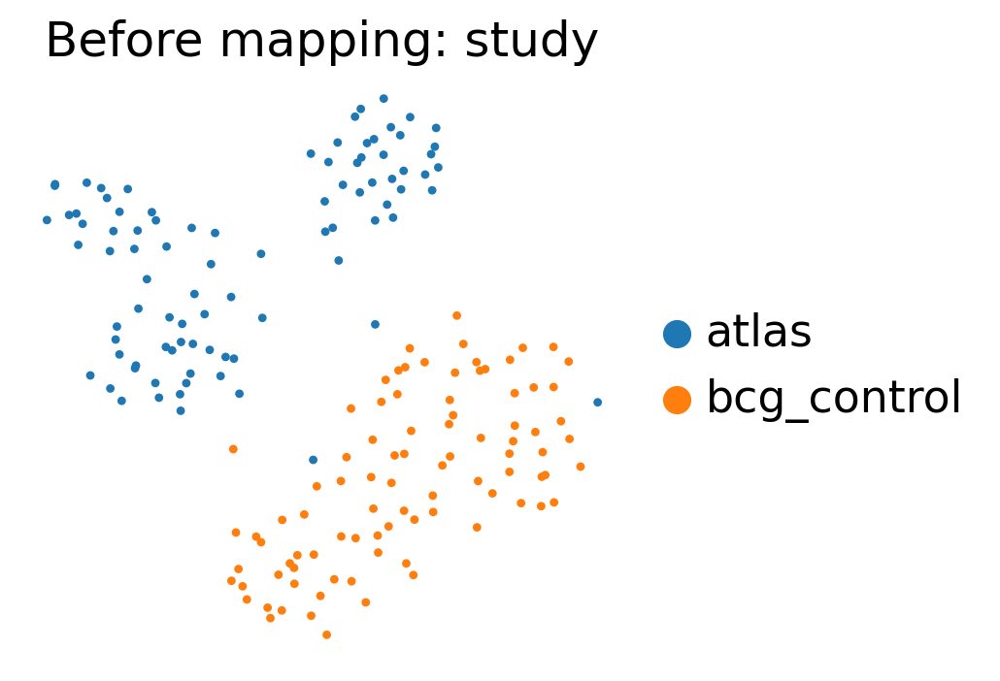

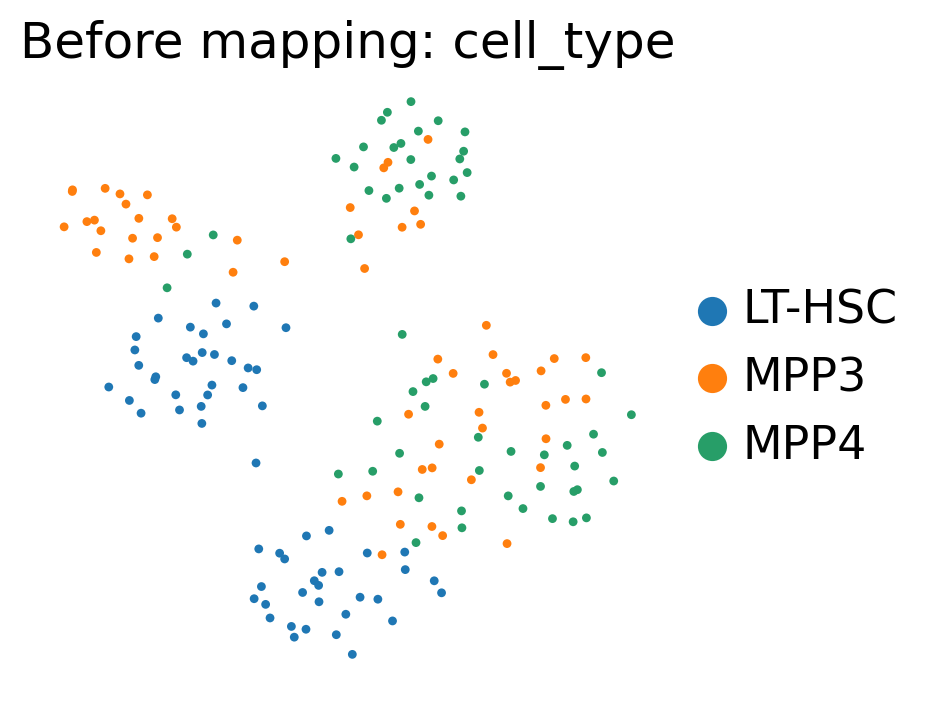


=== Ratio mapping ===
  atlas LT-HSC: 32 -> 30
  atlas MPP3: 51 -> 30
  atlas MPP4: 104 -> 30
  bcg LT-HSC ratio: 387 -> 30
  bcg MPP3 ratio: 783 -> 30
  bcg MPP4 ratio: 831 -> 30
computing PCA
    with n_comps=20
    finished (0:00:00)
computing neighbors
    finished (0:00:00)
computing UMAP
    finished (0:00:00)


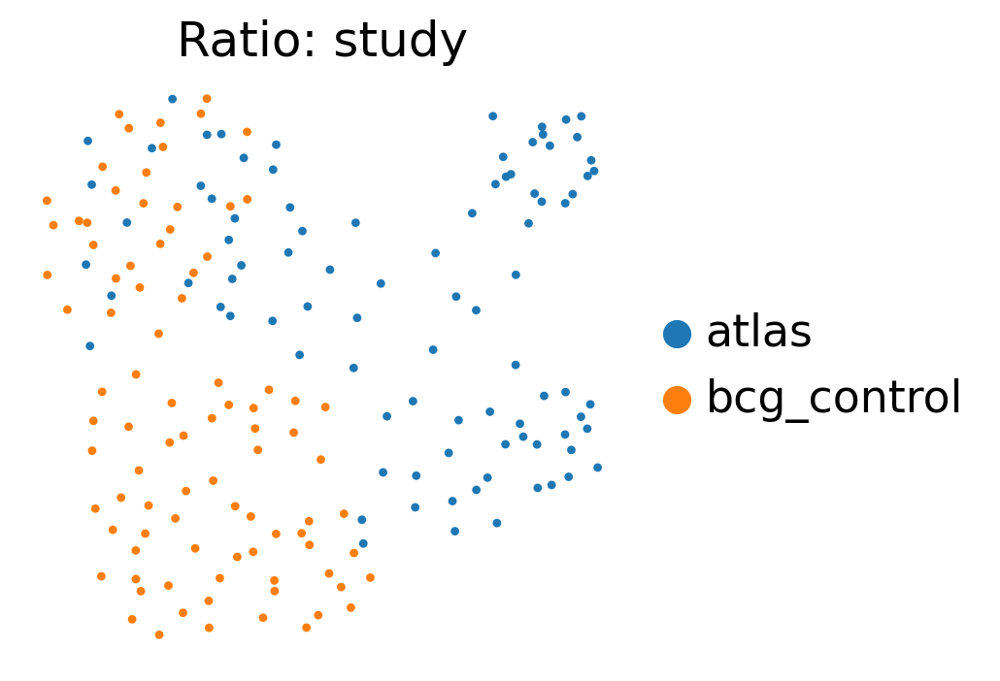

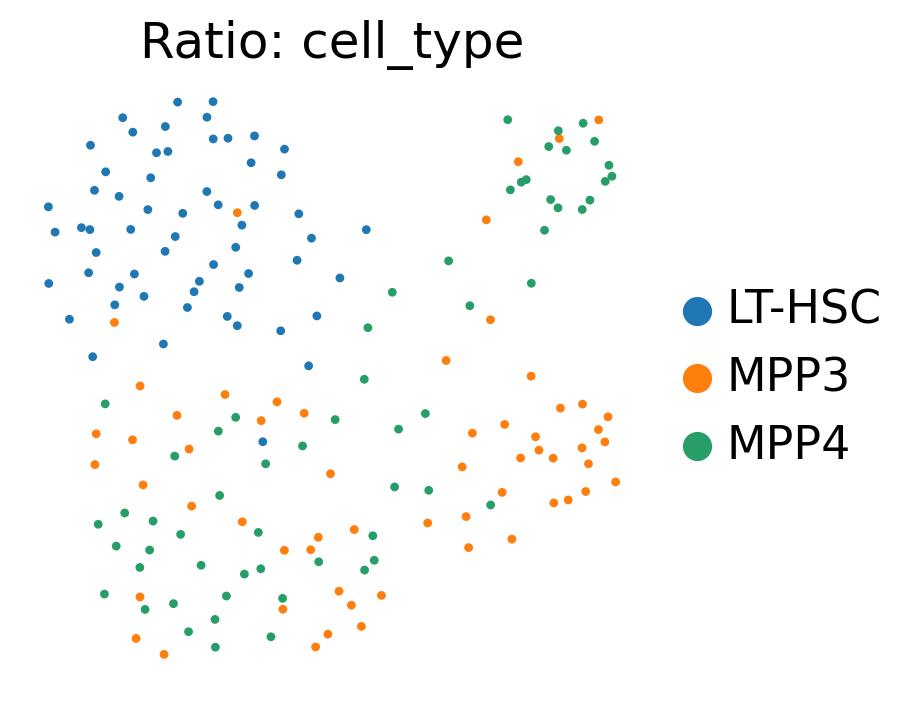


=== Symphony mapping ===
computing PCA
    with n_comps=20
    finished (0:00:00)
  atlas LT-HSC: 32 -> 30
  bcg LT-HSC: 387 -> 30
  atlas MPP3: 51 -> 30
  bcg MPP3: 783 -> 30
  atlas MPP4: 104 -> 30
  bcg MPP4: 831 -> 30
computing neighbors
    finished (0:00:00)
computing UMAP
    finished (0:00:00)


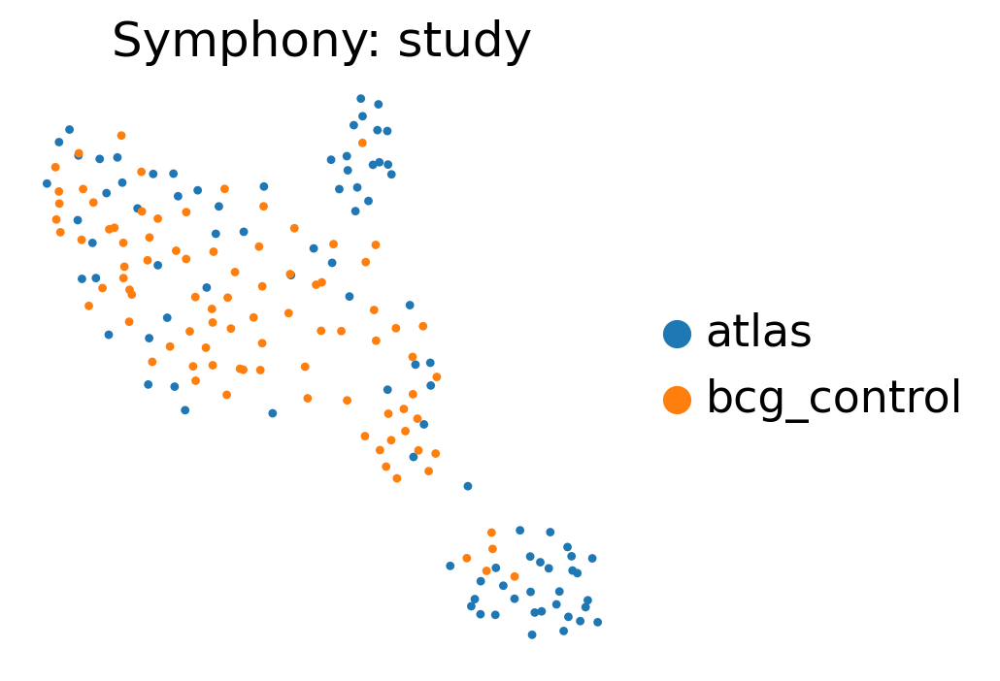

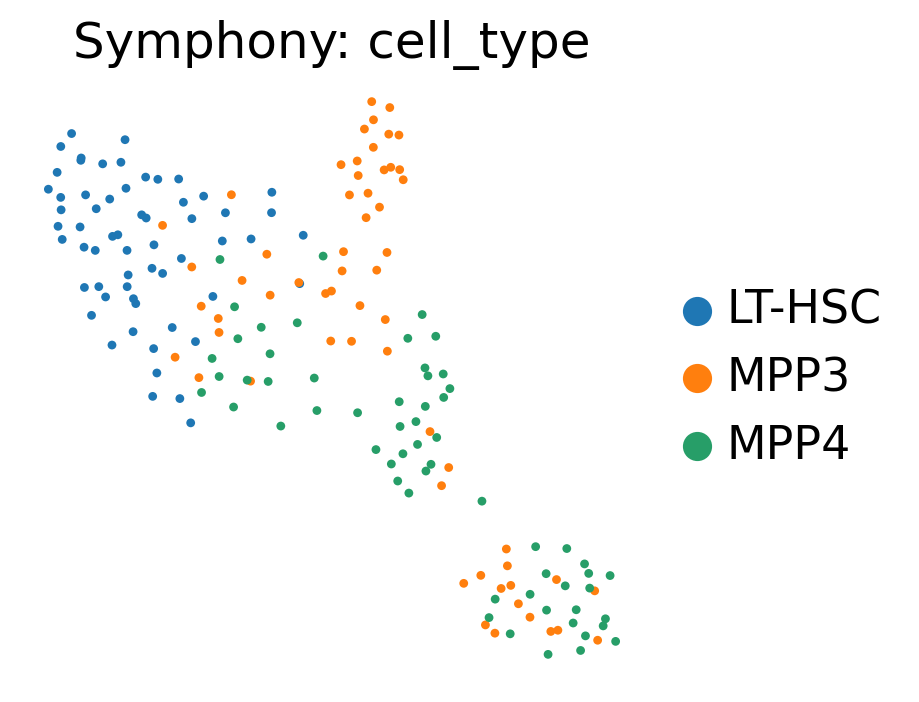


=== scANVI mapping ===


/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speci ...
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speci ...
/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightni

Epoch 100/100: 100%|██████████| 100/100 [00:04<00:00, 24.59it/s, v_num=1, train_loss=585]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [00:04<00:00, 21.84it/s, v_num=1, train_loss=585]
INFO     Training for 20 epochs.                                                                                   


/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speci ...
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speci ...
/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightni

Epoch 20/20: 100%|██████████| 20/20 [00:01<00:00, 16.56it/s, v_num=1, train_loss=601]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:01<00:00, 15.95it/s, v_num=1, train_loss=601]
INFO     Found 100.0% reference vars in query data.                                                                
INFO     Training for 50 epochs.                                                                                   


/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speci ...
/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speci ...
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightni

Epoch 50/50: 100%|██████████| 50/50 [00:16<00:00,  3.46it/s, v_num=1, train_loss=669]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [00:16<00:00,  3.11it/s, v_num=1, train_loss=669]
  atlas LT-HSC: 32 -> 30
  bcg LT-HSC: 387 -> 30
  atlas MPP3: 51 -> 30
  bcg MPP3: 783 -> 30
  atlas MPP4: 104 -> 30
  bcg MPP4: 831 -> 30
computing neighbors
    finished (0:00:00)
computing UMAP
    finished (0:00:00)


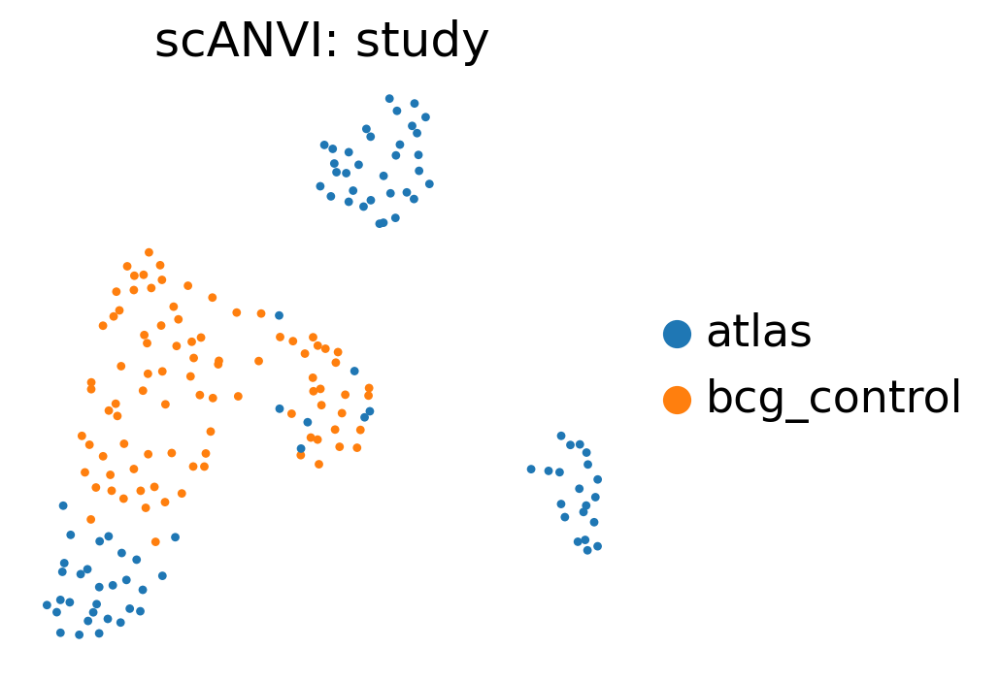

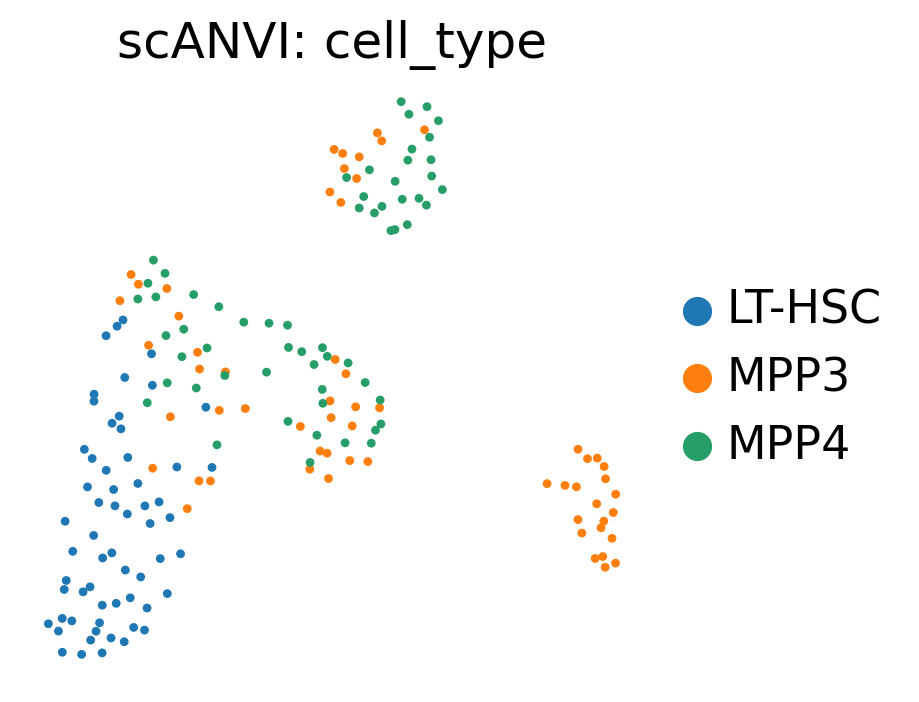


=== scIB metrics across methods ===
method                  before     ratio  Symphony    scANVI
metric                                                      
kBET_per_label        0.000000  0.344444  0.477778  0.027778
kNN_purity_all_types  0.680741  0.690741  0.655926  0.705556


method,before,ratio,Symphony,scANVI
metric,,,,
kBET_per_label,0.000000,0.344444,0.477778,0.027778
kNN_purity_all_types,0.680741,0.690741,0.655926,0.705556


In [31]:
import warnings
import symphonypy as sp
import scvi
from scvi.model import SCVI, SCANVI
from scib_metrics.nearest_neighbors import pynndescent
from scib_metrics.metrics import kbet_per_label
from sklearn.neighbors import NearestNeighbors

print(f"scvi-tools {scvi.__version__}")

N_PER_POP = 30
N_PCS = 20
K_NN = 15
rng = np.random.default_rng(0)
SCVI_MAX_EPOCHS = 100
SCANVI_MAX_EPOCHS = 20
QUERY_MAX_EPOCHS = 50


def _to_dense(X):
    return X.toarray() if sparse.issparse(X) else np.asarray(X)


def subsample_adata(adata, n=N_PER_POP):
    if adata.n_obs == 0:
        raise ValueError("empty AnnData")
    n_take = min(n, adata.n_obs)
    idx = rng.choice(adata.n_obs, size=n_take, replace=False)
    if adata.n_obs < n:
        print(f"  warning: only {adata.n_obs} cells (< {n})")
    return adata[idx].copy()


def ensure_counts(adata):
    """Prefer .layers['counts']; otherwise treat non-negative X as counts."""
    a = adata.copy()
    if "counts" not in a.layers:
        a.layers["counts"] = a.X.copy()
    return a


def prepare_pop(adata, study, cell_type, genes):
    out = adata[:, genes].copy()
    out.obs["study"] = study
    out.obs["cell_type"] = cell_type
    return out


def knn_purity(X, labels, n_neighbors=K_NN):
    labels = np.asarray(labels)
    n_neighbors = min(n_neighbors, len(labels) - 1)
    nn = NearestNeighbors(n_neighbors=n_neighbors + 1, metric="euclidean").fit(X)
    idx = nn.kneighbors(X, return_distance=False)[:, 1:]
    return float(np.mean([np.mean(labels[neigh] == labels[i]) for i, neigh in enumerate(idx)]))


def scib_two_metrics(X, batches, labels, condition):
    X = np.asarray(X, dtype=np.float64)
    batches = np.asarray(batches).astype(str)
    labels = np.asarray(labels).astype(str)
    n_neighbors = min(max(K_NN, 10), X.shape[0] - 1)
    neigh = pynndescent(X, n_neighbors=n_neighbors, random_state=0)
    kbet = float(kbet_per_label(neigh, batches=batches, labels=labels, alpha=0.05))
    purity = knn_purity(X, labels, n_neighbors=K_NN)
    return pd.DataFrame(
        [
            {"method": condition, "metric": "kBET_per_label", "value": kbet},
            {"method": condition, "metric": "kNN_purity_all_types", "value": purity},
        ]
    )


def run_umap_from_rep(adata, use_rep, title):
    a = adata.copy()
    sc.pp.neighbors(a, use_rep=use_rep)
    sc.tl.umap(a)
    for key in ["study", "cell_type"]:
        sc.pl.umap(a, color=key, size=40, title=f"{title}: {key}", show=True)
    return a


def build_balanced_parts(parts, n=N_PER_POP):
    out = []
    for name, adt in parts:
        print(f"  {name}: {adt.n_obs} -> {min(n, adt.n_obs)}")
        out.append(subsample_adata(adt, n=n))
    return ad.concat(out, join="inner", index_unique="-")


# ---------------------------------------------------------------------------
# Shared inputs
# ---------------------------------------------------------------------------
d0_mpp3_corr = transform_to_atlas(d0_mpp3, study_label="bcg_control")
d0_mpp4_corr = transform_to_atlas(d0_mpp4, study_label="bcg_control")
d0_mpp3_corr.obs["cell_type"] = "MPP3"
d0_mpp4_corr.obs["cell_type"] = "MPP4"

d0_lthsc_corr = bcg_control_corrected.copy()
d0_lthsc_corr.obs["study"] = "bcg_control"
d0_lthsc_corr.obs["cell_type"] = "LT-HSC"

map_genes = list(ATLAS_HVG_GENES)
print(f"Shared genes (atlas HVG {FLAVOR}): {len(map_genes)}")

atlas_lthsc_p = prepare_pop(atlas_lthsc, "atlas", "LT-HSC", map_genes)
atlas_mpp3_p = prepare_pop(atlas_mpp3, "atlas", "MPP3", map_genes)
atlas_mpp4_p = prepare_pop(atlas_mpp4, "atlas", "MPP4", map_genes)
bcg_lthsc_raw = prepare_pop(d0_lthsc, "bcg_control", "LT-HSC", map_genes)
bcg_mpp3_raw = prepare_pop(d0_mpp3, "bcg_control", "MPP3", map_genes)
bcg_mpp4_raw = prepare_pop(d0_mpp4, "bcg_control", "MPP4", map_genes)
bcg_lthsc_ratio = prepare_pop(d0_lthsc_corr, "bcg_control", "LT-HSC", map_genes)
bcg_mpp3_ratio = prepare_pop(d0_mpp3_corr, "bcg_control", "MPP3", map_genes)
bcg_mpp4_ratio = prepare_pop(d0_mpp4_corr, "bcg_control", "MPP4", map_genes)

atlas_parts = [
    ("atlas LT-HSC", atlas_lthsc_p),
    ("atlas MPP3", atlas_mpp3_p),
    ("atlas MPP4", atlas_mpp4_p),
]

# ===========================================================================
# 0) Before mapping (uncorrected BCG expression)
# ===========================================================================
print("\n=== Before reference mapping ===")
before_mapped = build_balanced_parts(
    atlas_parts
    + [
        ("bcg LT-HSC raw", bcg_lthsc_raw),
        ("bcg MPP3 raw", bcg_mpp3_raw),
        ("bcg MPP4 raw", bcg_mpp4_raw),
    ]
)
before_mapped.var["highly_variable"] = True
sc.pp.scale(before_mapped, max_value=10)
sc.tl.pca(before_mapped, n_comps=min(N_PCS, before_mapped.n_obs - 1), svd_solver="arpack")
before_mapped.obsm["X_method"] = before_mapped.obsm["X_pca"].copy()
before_mapped = run_umap_from_rep(before_mapped, "X_method", "Before mapping")

# ===========================================================================
# 1) Ratio method
# ===========================================================================
print("\n=== Ratio mapping ===")
ratio_mapped = build_balanced_parts(
    atlas_parts
    + [
        ("bcg LT-HSC ratio", bcg_lthsc_ratio),
        ("bcg MPP3 ratio", bcg_mpp3_ratio),
        ("bcg MPP4 ratio", bcg_mpp4_ratio),
    ]
)
ratio_mapped.var["highly_variable"] = True
sc.pp.scale(ratio_mapped, max_value=10)
sc.tl.pca(ratio_mapped, n_comps=min(N_PCS, ratio_mapped.n_obs - 1), svd_solver="arpack")
ratio_mapped.obsm["X_method"] = ratio_mapped.obsm["X_pca"].copy()
ratio_mapped = run_umap_from_rep(ratio_mapped, "X_method", "Ratio")

# ===========================================================================
# 2) Symphony (symphonypy)
# ===========================================================================
print("\n=== Symphony mapping ===")
# Reference: all atlas progenitors; Query: raw BCG progenitors
adata_ref = ad.concat(
    [atlas_lthsc_p, atlas_mpp3_p, atlas_mpp4_p], join="inner", index_unique="-"
).copy()
adata_query = ad.concat(
    [bcg_lthsc_raw, bcg_mpp3_raw, bcg_mpp4_raw], join="inner", index_unique="-"
).copy()

# Symphony expects log-normalized X, then scale (saving mean/std in .var) → PCA → Harmony
# Use fixed atlas HVG gene set (already projected); no per-dataset HVG selection
ref_hvg = list(ATLAS_HVG_GENES)
adata_ref = adata_ref[:, ref_hvg].copy()
adata_query = adata_query[:, ref_hvg].copy()

# Required by symphonypy.map_embedding: reference gene means/stds used to scale the query
sc.pp.scale(adata_ref, zero_center=True, max_value=10)
assert "mean" in adata_ref.var and "std" in adata_ref.var

sc.tl.pca(adata_ref, n_comps=min(N_PCS, adata_ref.n_obs - 1), svd_solver="arpack")
# Single-batch reference: still run Harmony to build Symphony extras in .uns["harmony"]
adata_ref.obs["batch"] = "atlas"
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sp.pp.harmony_integrate(adata_ref, key="batch")

adata_ref.var["highly_variable"] = True
adata_query.var["highly_variable"] = True
adata_query.obs["batch"] = "bcg_control"
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sp.tl.map_embedding(
        adata_query,
        adata_ref,
        key="batch",
        use_genes_column="highly_variable",
    )

# Joint object in Harmony/Symphony space (subsample after mapping for fair n=30)
sym_atlas = adata_ref.copy()
sym_atlas.obsm["X_method"] = sym_atlas.obsm["X_pca_harmony"].copy()
sym_query = adata_query.copy()
sym_query.obsm["X_method"] = sym_query.obsm["X_pca_harmony"].copy()

sym_parts = []
for ct in ["LT-HSC", "MPP3", "MPP4"]:
    sym_parts.append((f"atlas {ct}", sym_atlas[sym_atlas.obs["cell_type"] == ct].copy()))
    sym_parts.append((f"bcg {ct}", sym_query[sym_query.obs["cell_type"] == ct].copy()))

symphony_mapped = build_balanced_parts(sym_parts)
symphony_mapped = run_umap_from_rep(symphony_mapped, "X_method", "Symphony")

# ===========================================================================
# 3) scANVI reference mapping
# ===========================================================================
print("\n=== scANVI mapping ===")
ref_scanvi = ensure_counts(
    ad.concat([atlas_lthsc_p, atlas_mpp3_p, atlas_mpp4_p], join="inner", index_unique="-")
)
query_scanvi = ensure_counts(
    ad.concat([bcg_lthsc_raw, bcg_mpp3_raw, bcg_mpp4_raw], join="inner", index_unique="-")
)

# Use same HVGs as Symphony reference for comparability
ref_scanvi = ref_scanvi[:, ref_hvg].copy()
query_scanvi = query_scanvi[:, ref_hvg].copy()

ref_scanvi.obs["cell_type_scanvi"] = ref_scanvi.obs["cell_type"].astype(str)
query_scanvi.obs["cell_type_scanvi"] = "Unknown"
# Optionally reveal BCG LT-HSC labels (semi-supervised); keep MPPs Unknown for OOD-style mapping
query_scanvi.obs.loc[
    query_scanvi.obs["cell_type"] == "LT-HSC", "cell_type_scanvi"
] = "LT-HSC"

SCVI.setup_anndata(ref_scanvi, layer="counts", batch_key="study")
vae = SCVI(ref_scanvi, n_latent=min(30, N_PCS))
vae.train(max_epochs=SCVI_MAX_EPOCHS, early_stopping=True)

scanvi_model = SCANVI.from_scvi_model(
    vae,
    unlabeled_category="Unknown",
    labels_key="cell_type_scanvi",
)
scanvi_model.train(max_epochs=SCANVI_MAX_EPOCHS, early_stopping=True)

query_scanvi = query_scanvi.copy()
SCANVI.prepare_query_anndata(query_scanvi, scanvi_model)
query_model = SCANVI.load_query_data(query_scanvi, scanvi_model)
query_model.train(max_epochs=QUERY_MAX_EPOCHS)

ref_scanvi.obsm["X_scANVI"] = scanvi_model.get_latent_representation()
query_scanvi.obsm["X_scANVI"] = query_model.get_latent_representation()
ref_scanvi.obsm["X_method"] = ref_scanvi.obsm["X_scANVI"]
query_scanvi.obsm["X_method"] = query_scanvi.obsm["X_scANVI"]

scanvi_parts = []
for ct in ["LT-HSC", "MPP3", "MPP4"]:
    scanvi_parts.append((f"atlas {ct}", ref_scanvi[ref_scanvi.obs["cell_type"] == ct].copy()))
    scanvi_parts.append((f"bcg {ct}", query_scanvi[query_scanvi.obs["cell_type"] == ct].copy()))

scanvi_mapped = build_balanced_parts(scanvi_parts)
scanvi_mapped = run_umap_from_rep(scanvi_mapped, "X_method", "scANVI")

# ===========================================================================
# Metrics comparison
# ===========================================================================
print("\n=== scIB metrics across methods ===")
metrics_by_method = pd.concat(
    [
        scib_two_metrics(
            before_mapped.obsm["X_method"],
            before_mapped.obs["study"],
            before_mapped.obs["cell_type"],
            "before",
        ),
        scib_two_metrics(
            ratio_mapped.obsm["X_method"],
            ratio_mapped.obs["study"],
            ratio_mapped.obs["cell_type"],
            "ratio",
        ),
        scib_two_metrics(
            symphony_mapped.obsm["X_method"],
            symphony_mapped.obs["study"],
            symphony_mapped.obs["cell_type"],
            "Symphony",
        ),
        scib_two_metrics(
            scanvi_mapped.obsm["X_method"],
            scanvi_mapped.obs["study"],
            scanvi_mapped.obs["cell_type"],
            "scANVI",
        ),
    ],
    ignore_index=True,
)

comparison = metrics_by_method.pivot(index="metric", columns="method", values="value")
comparison = comparison.reindex(columns=["before", "ratio", "Symphony", "scANVI"])
print(comparison)
comparison



### Hyperparameter search: Symphony and scANVI (optimize kBET)

**Currently skipped.** Set `RUN_HYPERPARAMETER_SEARCH = True` in the next cell to run this grid search.

Grid-search Symphony and scANVI hyperparameters on the same balanced evaluation set (30 cells per study × cell type, fixed-seed balanced subsamples per study × cell type). Primary objective: maximize **kBET_per_label**; break ties with **kNN_purity_all_types**. Reports the best parameters and a summary table at the end.


In [32]:
# Temporarily skipped so the notebook can run end-to-end without the grid search.
# Set True to re-enable.
RUN_HYPERPARAMETER_SEARCH = False
if not RUN_HYPERPARAMETER_SEARCH:
    print("Skipping hyperparameter search (RUN_HYPERPARAMETER_SEARCH=False).")
else:
    from itertools import product
    import time

    # ---------------------------------------------------------------------------
    # Evaluation helper: balanced subsample by (study, cell_type) with a fixed seed.
    # Do NOT match on obs_names — ad.concat(..., index_unique="-") renames barcodes,
    # which previously made subset_eval return ~0 cells and NaN metrics.
    # ---------------------------------------------------------------------------
    EVAL_SEED = 0


    def balanced_eval_subset(adata, n_per_pop=N_PER_POP, seed=EVAL_SEED):
        """Take up to n_per_pop cells from each study × cell_type group."""
        rng_local = np.random.default_rng(seed)
        parts = []
        for study in ["atlas", "bcg_control"]:
            for ct in ["LT-HSC", "MPP3", "MPP4"]:
                mask = (
                    (adata.obs["study"].astype(str) == study)
                    & (adata.obs["cell_type"].astype(str) == ct)
                )
                sub = adata[mask]
                if sub.n_obs == 0:
                    print(f"  warning: no cells for {study} / {ct}")
                    continue
                n_take = min(n_per_pop, sub.n_obs)
                idx = rng_local.choice(sub.n_obs, size=n_take, replace=False)
                parts.append(sub[idx].copy())
        if not parts:
            return adata[[]].copy()
        return ad.concat(parts, join="inner", index_unique=None)


    def score_embedding(adata, use_rep="X_method"):
        if use_rep not in adata.obsm:
            return {
                "kBET_per_label": np.nan,
                "kNN_purity_all_types": np.nan,
                "n_cells": adata.n_obs,
                "error": f"missing obsm['{use_rep}']",
            }
        sub = balanced_eval_subset(adata)
        if sub.n_obs < 20:
            return {
                "kBET_per_label": np.nan,
                "kNN_purity_all_types": np.nan,
                "n_cells": sub.n_obs,
                "error": "too few eval cells",
            }
        try:
            X = np.asarray(sub.obsm[use_rep], dtype=np.float64)
            if not np.isfinite(X).all():
                X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)
            m = scib_two_metrics(
                X,
                sub.obs["study"],
                sub.obs["cell_type"],
                condition="tmp",
            )
            return {
                "kBET_per_label": float(m.loc[m["metric"] == "kBET_per_label", "value"].iloc[0]),
                "kNN_purity_all_types": float(m.loc[m["metric"] == "kNN_purity_all_types", "value"].iloc[0]),
                "n_cells": int(sub.n_obs),
            }
        except Exception as e:
            return {
                "kBET_per_label": np.nan,
                "kNN_purity_all_types": np.nan,
                "n_cells": int(sub.n_obs),
                "error": f"{type(e).__name__}: {e}",
            }


    def pick_best(df):
        """Maximize kBET, then purity."""
        return df.sort_values(
            ["kBET_per_label", "kNN_purity_all_types"],
            ascending=[False, False],
        ).iloc[0]


    # ===========================================================================
    # Symphony search
    # ===========================================================================
    print("\n=== Symphony hyperparameter search ===")

    symphony_grid = [
        {
            "n_hvg": n_hvg,
            "n_pcs": n_pcs,
            "theta": theta,
            "sigma": sigma,
            "lamb": lamb,
            "max_iter_harmony": max_iter,
        }
        for n_hvg, n_pcs, theta, sigma, lamb, max_iter in product(
            [len(ATLAS_HVG_GENES)],  # fixed atlas HVG set (do not re-select)
            [15, 20, 30],
            [1, 2, 4],          # diversity cluster penalty (higher → stronger batch mixing pressure in Harmony)
            [0.05, 0.1, 0.2],  # soft k-means bandwidth for Symphony mapping
            [0.1, 1.0],        # ridge / entropy-related Harmony/Symphony lambda
            [10, 20],
        )
    ]
    # Keep search tractable: subsample grid to a structured subset (~24 trials)
    _symphony_keep = []
    for n_hvg in [1000, 2000]:
        for n_pcs in [15, 20, 30]:
            for theta in [1, 2, 4]:
                for sigma in [0.05, 0.1, 0.2]:
                    _symphony_keep.append(
                        {
                            "n_hvg": n_hvg,
                            "n_pcs": n_pcs,
                            "theta": theta,
                            "sigma": sigma,
                            "lamb": 1.0 if theta >= 2 else 0.1,
                            "max_iter_harmony": 20 if n_pcs >= 20 else 10,
                        }
                    )
    # Deduplicate while preserving order
    _seen = set()
    symphony_grid = []
    for d in _symphony_keep:
        t = tuple(sorted(d.items()))
        if t not in _seen:
            _seen.add(t)
            symphony_grid.append(d)
    print(f"Symphony trials: {len(symphony_grid)}")


    def run_symphony(params, plot=False, title_suffix=""):
        ref = ad.concat(
            [atlas_lthsc_p, atlas_mpp3_p, atlas_mpp4_p], join="inner", index_unique="-"
        ).copy()
        query = ad.concat(
            [bcg_lthsc_raw, bcg_mpp3_raw, bcg_mpp4_raw], join="inner", index_unique="-"
        ).copy()

        # Genes are already atlas HVGs
        hvg = list(ref.var_names[: params["n_hvg"]])
        ref = ref[:, hvg].copy()
        query = query[:, hvg].copy()

        sc.pp.scale(ref, zero_center=True, max_value=10)
        n_comps = min(params["n_pcs"], ref.n_obs - 1, ref.n_vars - 1)
        sc.tl.pca(ref, n_comps=n_comps, svd_solver="arpack")
        ref.obs["batch"] = "atlas"
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            sp.pp.harmony_integrate(
                ref,
                key="batch",
                theta=params["theta"],
                lamb=params["lamb"],
                max_iter_harmony=params["max_iter_harmony"],
                verbose=False,
            )

        ref.var["highly_variable"] = True
        query.var["highly_variable"] = True
        query.obs["batch"] = "bcg_control"
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            sp.tl.map_embedding(
                query,
                ref,
                key="batch",
                use_genes_column="highly_variable",
                sigma=params["sigma"],
                lamb=params["lamb"],
            )

        ref.obsm["X_method"] = ref.obsm["X_pca_harmony"].copy()
        query.obsm["X_method"] = query.obsm["X_pca_harmony"].copy()
        mapped = ad.concat([ref, query], join="inner", index_unique="-")
        if plot:
            mapped = run_umap_from_rep(mapped, "X_method", f"Symphony best{title_suffix}")
        return mapped


    symphony_rows = []
    for i, params in enumerate(symphony_grid, 1):
        t0 = time.time()
        try:
            mapped = run_symphony(params, plot=False)
            scores = score_embedding(mapped)
            row = {**params, **scores, "status": "ok", "seconds": time.time() - t0}
        except Exception as e:
            row = {**params, "kBET_per_label": np.nan, "kNN_purity_all_types": np.nan,
                   "n_cells": np.nan, "status": f"fail: {type(e).__name__}: {e}", "seconds": time.time() - t0}
        symphony_rows.append(row)
        err = row.get("error", "")
        print(
            f"[{i}/{len(symphony_grid)}] hvg={params['n_hvg']} pcs={params['n_pcs']} "
            f"theta={params['theta']} sigma={params['sigma']} lamb={params['lamb']} "
            f"-> kBET={row['kBET_per_label']!s} purity={row['kNN_purity_all_types']!s} "
            f"n={row.get('n_cells', '?')} ({row['status']}, {row['seconds']:.1f}s)"
            + (f" err={err}" if err else "")
        )

    symphony_search_results = pd.DataFrame(symphony_rows)
    symphony_ok = symphony_search_results[symphony_search_results["status"] == "ok"].copy()
    if symphony_ok.empty:
        raise RuntimeError("All Symphony trials failed; see symphony_search_results['status']")
    best_symphony = pick_best(symphony_ok)
    print("\nBest Symphony parameters:")
    print(best_symphony[["n_hvg", "n_pcs", "theta", "sigma", "lamb", "max_iter_harmony",
                         "kBET_per_label", "kNN_purity_all_types"]])

    # ===========================================================================
    # scANVI search
    # ===========================================================================
    print("\n=== scANVI hyperparameter search ===")

    # Smaller epoch budget during search; final best refit uses fuller epochs
    scanvi_grid = []
    for n_latent, n_layers, n_hidden, dropout, gene_likelihood, label_query_lthsc, n_hvg in product(
        [10, 20, 30],
        [1, 2],
        [64, 128],
        [0.05, 0.1],
        ["zinb", "nb"],
        [True, False],
        [1000, 2000],
    ):
        scanvi_grid.append(
            {
                "n_latent": n_latent,
                "n_layers": n_layers,
                "n_hidden": n_hidden,
                "dropout_rate": dropout,
                "gene_likelihood": gene_likelihood,
                "label_query_lthsc": label_query_lthsc,
                "n_hvg": n_hvg,
                "scvi_epochs": 60,
                "scanvi_epochs": 15,
                "query_epochs": 40,
            }
        )

    # Structured subset (~18 trials) prioritizing factors that often affect mixing
    _scanvi_keep = []
    for n_latent in [10, 20, 30]:
        for n_layers in [1, 2]:
            for gene_likelihood in ["zinb", "nb"]:
                for label_query_lthsc in [True, False]:
                    for n_hvg in [len(ATLAS_HVG_GENES)]:
                        _scanvi_keep.append(
                            {
                                "n_latent": n_latent,
                                "n_layers": n_layers,
                                "n_hidden": 128 if n_latent >= 20 else 64,
                                "dropout_rate": 0.1 if n_layers == 2 else 0.05,
                                "gene_likelihood": gene_likelihood,
                                "label_query_lthsc": label_query_lthsc,
                                "n_hvg": n_hvg,
                                "scvi_epochs": 60,
                                "scanvi_epochs": 15,
                                "query_epochs": 40,
                            }
                        )
    _seen = set()
    scanvi_grid = []
    for d in _scanvi_keep:
        # Prefer a leaner grid: skip some redundant combos
        if d["n_hvg"] == 1000 and d["n_latent"] == 30 and d["n_layers"] == 2:
            continue
        t = tuple(sorted(d.items()))
        if t not in _seen:
            _seen.add(t)
            scanvi_grid.append(d)
    # Cap at 16 trials for runtime
    scanvi_grid = scanvi_grid[:16]
    print(f"scANVI trials: {len(scanvi_grid)}")


    def run_scanvi(params, plot=False, title_suffix="", fuller_epochs=False):
        ref = ensure_counts(
            ad.concat([atlas_lthsc_p, atlas_mpp3_p, atlas_mpp4_p], join="inner", index_unique="-")
        )
        query = ensure_counts(
            ad.concat([bcg_lthsc_raw, bcg_mpp3_raw, bcg_mpp4_raw], join="inner", index_unique="-")
        )

        # HVGs from reference log-normalized X (already log-normalized upstream)
        tmp = ref.copy()
        hvg = list(tmp.var_names[: params["n_hvg"]])
        ref = ref[:, hvg].copy()
        query = query[:, hvg].copy()

        ref.obs["cell_type_scanvi"] = ref.obs["cell_type"].astype(str)
        query.obs["cell_type_scanvi"] = "Unknown"
        if params["label_query_lthsc"]:
            query.obs.loc[query.obs["cell_type"] == "LT-HSC", "cell_type_scanvi"] = "LT-HSC"

        scvi_epochs = 100 if fuller_epochs else params["scvi_epochs"]
        scanvi_epochs = 25 if fuller_epochs else params["scanvi_epochs"]
        query_epochs = 50 if fuller_epochs else params["query_epochs"]

        SCVI.setup_anndata(ref, layer="counts", batch_key="study")
        vae = SCVI(
            ref,
            n_latent=params["n_latent"],
            n_layers=params["n_layers"],
            n_hidden=params["n_hidden"],
            dropout_rate=params["dropout_rate"],
            gene_likelihood=params["gene_likelihood"],
        )
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            vae.train(max_epochs=scvi_epochs, early_stopping=True)

        scanvi_model = SCANVI.from_scvi_model(
            vae,
            unlabeled_category="Unknown",
            labels_key="cell_type_scanvi",
        )
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            scanvi_model.train(max_epochs=scanvi_epochs, early_stopping=True)

        query = query.copy()
        SCANVI.prepare_query_anndata(query, scanvi_model)
        query_model = SCANVI.load_query_data(query, scanvi_model)
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            query_model.train(max_epochs=query_epochs)

        ref.obsm["X_method"] = scanvi_model.get_latent_representation()
        query.obsm["X_method"] = query_model.get_latent_representation()
        mapped = ad.concat([ref, query], join="inner", index_unique="-")
        if plot:
            mapped = run_umap_from_rep(mapped, "X_method", f"scANVI best{title_suffix}")
        return mapped


    scanvi_rows = []
    for i, params in enumerate(scanvi_grid, 1):
        t0 = time.time()
        try:
            mapped = run_scanvi(params, plot=False)
            scores = score_embedding(mapped)
            row = {**params, **scores, "status": "ok", "seconds": time.time() - t0}
        except Exception as e:
            row = {**params, "kBET_per_label": np.nan, "kNN_purity_all_types": np.nan,
                   "n_cells": np.nan, "status": f"fail: {type(e).__name__}: {e}", "seconds": time.time() - t0}
        scanvi_rows.append(row)
        print(
            f"[{i}/{len(scanvi_grid)}] latent={params['n_latent']} layers={params['n_layers']} "
            f"lik={params['gene_likelihood']} label_LTHSC={params['label_query_lthsc']} hvg={params['n_hvg']} "
            f"-> kBET={row['kBET_per_label']!s} purity={row['kNN_purity_all_types']!s} "
            f"({row['status']}, {row['seconds']:.1f}s)"
        )

    scanvi_search_results = pd.DataFrame(scanvi_rows)
    scanvi_ok = scanvi_search_results[scanvi_search_results["status"] == "ok"].copy()
    if scanvi_ok.empty:
        raise RuntimeError("All scANVI trials failed; see scanvi_search_results['status']")
    best_scanvi = pick_best(scanvi_ok)
    print("\nBest scANVI parameters:")
    print(best_scanvi[[
        "n_latent", "n_layers", "n_hidden", "dropout_rate", "gene_likelihood",
        "label_query_lthsc", "n_hvg", "kBET_per_label", "kNN_purity_all_types",
    ]])

    # ===========================================================================
    # Refit best models, UMAPs, and final report
    # ===========================================================================
    print("\n=== Refitting best Symphony / scANVI and summarizing ===")
    best_symphony_params = best_symphony[
        ["n_hvg", "n_pcs", "theta", "sigma", "lamb", "max_iter_harmony"]
    ].to_dict()
    best_scanvi_params = best_scanvi[[
        "n_latent", "n_layers", "n_hidden", "dropout_rate", "gene_likelihood",
        "label_query_lthsc", "n_hvg", "scvi_epochs", "scanvi_epochs", "query_epochs",
    ]].to_dict()

    symphony_best_mapped = run_symphony(best_symphony_params, plot=True, title_suffix=" (tuned)")
    scanvi_best_mapped = run_scanvi(best_scanvi_params, plot=True, title_suffix=" (tuned)", fuller_epochs=True)

    # Baseline metrics on the same eval barcodes
    before_scores = score_embedding(before_mapped)
    ratio_scores = score_embedding(ratio_mapped)
    sym_default_scores = score_embedding(symphony_mapped)
    scanvi_default_scores = score_embedding(scanvi_mapped)
    sym_best_scores = score_embedding(symphony_best_mapped)
    scanvi_best_scores = score_embedding(scanvi_best_mapped)

    final_report = pd.DataFrame(
        [
            {"method": "before", "kBET_per_label": before_scores["kBET_per_label"],
             "kNN_purity_all_types": before_scores["kNN_purity_all_types"]},
            {"method": "ratio", "kBET_per_label": ratio_scores["kBET_per_label"],
             "kNN_purity_all_types": ratio_scores["kNN_purity_all_types"]},
            {"method": "Symphony (default)", "kBET_per_label": sym_default_scores["kBET_per_label"],
             "kNN_purity_all_types": sym_default_scores["kNN_purity_all_types"]},
            {"method": "Symphony (tuned)", "kBET_per_label": sym_best_scores["kBET_per_label"],
             "kNN_purity_all_types": sym_best_scores["kNN_purity_all_types"]},
            {"method": "scANVI (default)", "kBET_per_label": scanvi_default_scores["kBET_per_label"],
             "kNN_purity_all_types": scanvi_default_scores["kNN_purity_all_types"]},
            {"method": "scANVI (tuned)", "kBET_per_label": scanvi_best_scores["kBET_per_label"],
             "kNN_purity_all_types": scanvi_best_scores["kNN_purity_all_types"]},
        ]
    ).set_index("method")

    print("\n========== BEST PARAMETERS ==========")
    print("Symphony:")
    for k, v in best_symphony_params.items():
        print(f"  {k}: {v}")
    print(f"  kBET_per_label: {sym_best_scores['kBET_per_label']:.4f}")
    print(f"  kNN_purity_all_types: {sym_best_scores['kNN_purity_all_types']:.4f}")

    print("\nscANVI:")
    for k, v in best_scanvi_params.items():
        print(f"  {k}: {v}")
    print(f"  kBET_per_label: {scanvi_best_scores['kBET_per_label']:.4f}")
    print(f"  kNN_purity_all_types: {scanvi_best_scores['kNN_purity_all_types']:.4f}")

    print("\n========== RESULTS TABLE (fixed-seed balanced eval subsets) ==========")
    print(final_report)
    print("\nTop 10 Symphony trials by kBET:")
    print(symphony_search_results.sort_values("kBET_per_label", ascending=False).head(10))
    print("\nTop 10 scANVI trials by kBET:")
    print(scanvi_search_results.sort_values("kBET_per_label", ascending=False).head(10))
    final_report



Skipping hyperparameter search (RUN_HYPERPARAMETER_SEARCH=False).


In [33]:
# Atlas HVGs zero-filled in BCG projection (absent from BCG via one2one ortholog map)
_name_df = pd.read_csv(
    ORTHO_CACHE,
    usecols=["human_ensembl_id", "human_gene_name"],
)
_name_df["human_ensembl_id"] = _name_df["human_ensembl_id"].astype(str).map(strip_ensembl_gene_id)
ensg2human_name = (
    _name_df.dropna(subset=["human_ensembl_id"])
    .drop_duplicates("human_ensembl_id")
    .set_index("human_ensembl_id")["human_gene_name"]
    .astype(str)
    .to_dict()
)
ensg2mouse_name = (
    ortho_df.dropna(subset=["human_ensembl_id"])
    .drop_duplicates("human_ensembl_id")
    .set_index("human_ensembl_id")["mouse_gene_name"]
    .astype(str)
    .to_dict()
)

bcg_musg = {m for m in _resolve_ensmusg_per_col(mouse_d0) if m} | {m for m in _resolve_ensmusg_per_col(mouse_d28) if m}
rows = []
for ensg in ATLAS_HVG_GENES:
    musg = ENSG2MUSG.get(ensg)
    if musg is None:
        reason = "no_one2one_ortholog"
    elif musg not in bcg_musg:
        reason = "ortholog_absent_from_bcg"
    else:
        continue
    rows.append(
        {
            "ensembl_id": ensg,
            "gene_name": ensg2human_name.get(ensg, ""),
            "mouse_ensembl_id": musg or "",
            "mouse_gene_name": ensg2mouse_name.get(ensg, ""),
            "reason": reason,
        }
    )

missing_hvg_df = pd.DataFrame(rows)
print(
    f"Zero-filled atlas HVGs (not overlapping BCG): "
    f"{len(missing_hvg_df)}/{len(ATLAS_HVG_GENES)}"
)
print(missing_hvg_df["reason"].value_counts().to_string())
print()
pd.set_option("display.max_rows", None)
pd.set_option("display.max_colwidth", 40)
print(missing_hvg_df.to_string(index=False))
missing_hvg_df


Zero-filled atlas HVGs (not overlapping BCG): 4/1000
reason
ortholog_absent_from_bcg    4

     ensembl_id gene_name   mouse_ensembl_id mouse_gene_name                   reason
ENSG00000188257   PLA2G2A ENSMUSG00000058908         Pla2g2a ortholog_absent_from_bcg
ENSG00000204287   HLA-DRA ENSMUSG00000036322           H2-Ea ortholog_absent_from_bcg
ENSG00000221869     CEBPD ENSMUSG00000071637           Cebpd ortholog_absent_from_bcg
ENSG00000284713    SMIM38 ENSMUSG00000109305          Smim38 ortholog_absent_from_bcg


,ensembl_id,gene_name,mouse_ensembl_id,mouse_gene_name,reason
0,ENSG00000188257,PLA2G2A,ENSMUSG00000058908,Pla2g2a,ortholog_absent_from_bcg
1,ENSG00000204287,HLA-DRA,ENSMUSG00000036322,H2-Ea,ortholog_absent_from_bcg
2,ENSG00000221869,CEBPD,ENSMUSG00000071637,Cebpd,ortholog_absent_from_bcg
3,ENSG00000284713,SMIM38,ENSMUSG00000109305,Smim38,ortholog_absent_from_bcg


### Save scANVI-mapped BCG LT-HSCs in atlas count space
Train default scANVI on atlas LT-HSC / MPP3 / MPP4, map day-0 (control) and day-28 (treated) BCG LT-HSCs, and decode expression conditioned on the **atlas** batch into `.layers['counts']` (count-scale, atlas technical space — not PCA/latent). Write:
- `tb/data/mouse_bcg/bcg_control_scanvi_081826.h5ad`
- `tb/data/mouse_bcg/bcg_treated_scanvi_081826.h5ad`


In [34]:
import warnings
import os
from scipy import sparse
from scvi.model import SCVI, SCANVI

SCVI_MAX_EPOCHS = int(globals().get("SCVI_MAX_EPOCHS", 100))
SCANVI_MAX_EPOCHS = int(globals().get("SCANVI_MAX_EPOCHS", 20))
QUERY_MAX_EPOCHS = int(globals().get("QUERY_MAX_EPOCHS", 50))
n_pcs = int(globals().get("N_PCS", 20))


def _atlas_pop(prepared, raw, cell_type):
    if prepared is not None:
        return prepared
    out = raw.copy()
    out.obs["study"] = "atlas"
    out.obs["cell_type"] = cell_type
    return out


def ensure_counts(adata):
    a = adata.copy()
    if "counts" not in a.layers:
        a.layers["counts"] = a.X.copy()
    return a


_atlas_lthsc = _atlas_pop(globals().get("atlas_lthsc_p"), atlas_lthsc, "LT-HSC")
_atlas_mpp3 = _atlas_pop(globals().get("atlas_mpp3_p"), atlas_mpp3, "MPP3")
_atlas_mpp4 = _atlas_pop(globals().get("atlas_mpp4_p"), atlas_mpp4, "MPP4")

# Use every gene from ATLAS_HVG_H5AD (already the column space of these objects).
# Do not drop lowly expressed genes with a second HVG / min_cells filter.
ref_hvg = list(ATLAS_HVG_GENES)
print(f"Genes for scANVI (all ATLAS_HVG_H5AD genes): {len(ref_hvg)}")

ref = ensure_counts(
    ad.concat(
        [
            _atlas_lthsc[:, ref_hvg].copy(),
            _atlas_mpp3[:, ref_hvg].copy(),
            _atlas_mpp4[:, ref_hvg].copy(),
        ],
        join="inner",
        index_unique="-",
    )
)

ref.obs["cell_type_scanvi"] = ref.obs["cell_type"].astype(str)
if "study" not in ref.obs.columns:
    ref.obs["study"] = "atlas"
else:
    ref.obs["study"] = ref.obs["study"].astype(str).fillna("atlas")

SCVI.setup_anndata(ref, layer="counts", batch_key="study")
vae = SCVI(ref, n_latent=min(30, n_pcs))
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    vae.train(max_epochs=SCVI_MAX_EPOCHS, early_stopping=True)

scanvi_model = SCANVI.from_scvi_model(
    vae,
    unlabeled_category="Unknown",
    labels_key="cell_type_scanvi",
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    scanvi_model.train(max_epochs=SCANVI_MAX_EPOCHS, early_stopping=True)


def map_lthsc_to_atlas_counts(query_adata, study_label, query_model_train_epochs=QUERY_MAX_EPOCHS):
    """Map query LT-HSCs with scANVI and write atlas-batch counts into .layers['counts']."""
    q = ensure_counts(query_adata[:, ref_hvg].copy())
    q.obs["study"] = study_label
    q.obs["cell_type"] = "LT-HSC"
    # LT-HSC query labels (semi-supervised)
    q.obs["cell_type_scanvi"] = "LT-HSC"

    # Preserve original counts
    q.layers["counts_original"] = q.layers["counts"].copy()

    SCANVI.prepare_query_anndata(q, scanvi_model)
    q_model = SCANVI.load_query_data(q, scanvi_model)
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        q_model.train(max_epochs=query_model_train_epochs)

    # Decode to atlas batch: expression frequencies in atlas technical space
    # then rescale by each cell's original library size → count-scale .layers['counts']
    freq = q_model.get_normalized_expression(
        adata=q,
        transform_batch="atlas",
        library_size=1.0,
        return_numpy=True,
    )
    lib = np.asarray(q.layers["counts_original"].sum(axis=1)).ravel()
    counts_atlas = np.asarray(freq) * lib[:, None]
    counts_atlas = np.maximum(counts_atlas, 0).astype(np.float32)
    q.layers["counts"] = sparse.csr_matrix(counts_atlas)

    # Also store latent for reference; primary corrected data is layers['counts']
    q.obsm["X_scANVI"] = q_model.get_latent_representation()
    q.uns["scanvi_mapping"] = {
        "reference": "atlas LT-HSC + MPP3 + MPP4",
        "n_hvg": len(ref_hvg),
        "transform_batch": "atlas",
        "counts_layer": "decoded to atlas batch, scaled by original library size",
        "query_study": study_label,
    }
    return q


bcg_control_scanvi = map_lthsc_to_atlas_counts(d0_lthsc, "bcg_control")
bcg_treated_scanvi = map_lthsc_to_atlas_counts(d28_lthsc, "bcg")

bcg_control_scanvi.write_h5ad(CONTROL_OUT)
bcg_treated_scanvi.write_h5ad(TREATED_OUT)

print(f"Wrote {CONTROL_OUT}")
print(
    f"  n_obs={bcg_control_scanvi.n_obs}, n_vars={bcg_control_scanvi.n_vars}, "
    f"layers={list(bcg_control_scanvi.layers.keys())}"
)
print(
    f"  counts sum (original vs atlas-mapped): "
    f"{np.asarray(bcg_control_scanvi.layers['counts_original'].sum()):.1f} -> "
    f"{np.asarray(bcg_control_scanvi.layers['counts'].sum()):.1f}"
)
print(f"Wrote {TREATED_OUT}")
print(
    f"  n_obs={bcg_treated_scanvi.n_obs}, n_vars={bcg_treated_scanvi.n_vars}, "
    f"layers={list(bcg_treated_scanvi.layers.keys())}"
)
print(
    f"  counts sum (original vs atlas-mapped): "
    f"{np.asarray(bcg_treated_scanvi.layers['counts_original'].sum()):.1f} -> "
    f"{np.asarray(bcg_treated_scanvi.layers['counts'].sum()):.1f}"
)

bcg_control_scanvi, bcg_treated_scanvi



Genes for scANVI (all ATLAS_HVG_H5AD genes): 1000


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 100/100: 100%|██████████| 100/100 [00:04<00:00, 24.26it/s, v_num=1, train_loss=580]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [00:04<00:00, 20.91it/s, v_num=1, train_loss=580]
INFO     Training for 20 epochs.                                                                                   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 20/20: 100%|██████████| 20/20 [00:01<00:00, 12.13it/s, v_num=1, train_loss=594]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:01<00:00, 10.34it/s, v_num=1, train_loss=594]
INFO     Found 100.0% reference vars in query data.                                                                
INFO     Training for 50 epochs.                                                                                   


/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speci ...
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 50/50: 100%|██████████| 50/50 [00:03<00:00,  9.74it/s, v_num=1, train_loss=806]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s, v_num=1, train_loss=806]
INFO     Found 100.0% reference vars in query data.                                                                
INFO     Training for 50 epochs.                                                                                   


/n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speciesOT_env/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/speci ...
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 50/50: 100%|██████████| 50/50 [00:02<00:00, 19.60it/s, v_num=1, train_loss=395]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s, v_num=1, train_loss=395]
Wrote /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/tb/data/mouse_bcg/bcg_control_scanvi_081826.h5ad
  n_obs=387, n_vars=1000, layers=['counts', 'counts_original']
  counts sum (original vs atlas-mapped): 720873.0 -> 720873.0
Wrote /n/holylabs/mooney_lab/Lab/joshprice/speciesOT/tb/data/mouse_bcg/bcg_treated_scanvi_081826.h5ad
  n_obs=251, n_vars=1000, layers=['counts', 'counts_original']
  counts sum (original vs atlas-mapped): 51404.0 -> 51404.0


(AnnData object with n_obs × n_vars = 387 × 1000
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'day', 'leiden', 'cell_type', 'shared_cell_type', 'study', 'cell_type_scanvi', '_scvi_batch', '_scvi_labels'
     var: 'highly_variable'
     uns: 'atlas_hvg', '_scvi_uuid', '_scvi_manager_uuid', 'scanvi_mapping'
     obsm: 'X_scANVI'
     layers: 'counts', 'counts_original',
 AnnData object with n_obs × n_vars = 251 × 1000
     obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'day', 'leiden', 'cell_type', 'shared_cell_type', 'study', 'cell_type_scanvi', '_scvi_batch', '_scvi_labels'
     var: 'highly_variable'
     uns: 'atlas_hvg', '_scvi_uuid', '_scvi_manager_uuid', 'scanvi_mapping'
     obsm: 'X_scANVI'
     layers: 'counts', 'counts_original')

In [35]:
bcg_treated_scanvi

AnnData object with n_obs × n_vars = 251 × 1000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'day', 'leiden', 'cell_type', 'shared_cell_type', 'study', 'cell_type_scanvi', '_scvi_batch', '_scvi_labels'
    var: 'highly_variable'
    uns: 'atlas_hvg', '_scvi_uuid', '_scvi_manager_uuid', 'scanvi_mapping'
    obsm: 'X_scANVI'
    layers: 'counts', 'counts_original'